# Riga real estate 
The dataset contains 4689 real estate objects in Riga. 

The main purpose of this analysis is to analyze the data and to develop a predictive model that will allow to predict future prices in Riga.

source: https://www.kaggle.com/trolukovich/riga-real-estate-dataset [1.04.2020]

Columns description:
- op_type - offer type,
- district - district, where real estate object located,
- street - address of real estate object,
- rooms - number of rooms,
- area - living area of real estate object,
- floor - floor of rel estate object,
- total_floors - total amount of floors in building,
- house_seria - house design,
- house_type - type of building,
- condition - stuffing premises,
- lat / lon - latitude and longitude of real estate object,
- price - price in EUR.

In [1]:
#importing basic libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import cKDTree
from scipy import stats, inf
import re
#setting charts to be plotted in the same window as code, setting seaborn style for all plots and
#setting format for numbers in pandas tables as float with three decimal digits
%matplotlib inline
plt.style.use('seaborn')
pd.set_option('display.float_format', lambda x: '%.3f' % x)
#models for regression predictions
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Lasso, ElasticNet, Ridge, HuberRegressor
from sklearn.linear_model import BayesianRidge, LogisticRegression, SGDRegressor
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, StackingRegressor
from sklearn.ensemble import AdaBoostRegressor, ExtraTreesRegressor, VotingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
#supporting methods and classes for machine learning
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV, train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, QuantileTransformer
from sklearn.metrics import mean_squared_error
from sklearn.compose import TransformedTargetRegressor
#artificial neural network
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.wrappers.scikit_learn import KerasRegressor

Using TensorFlow backend.


In [2]:
df = pd.read_csv('riga_re.csv')
df.head()

,op_type,district,street,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon
0,For rent,Purvciems,Dzelzavas 93,1,27.000,3.000,5.000,LT proj.,Brick-Panel,All amenities,250.000,56.955,24.202
1,For rent,Ziepniekkalns,Ozolciema 32,2,50.000,7.000,9.000,602.,Panel,All amenities,300.000,56.900,24.098
2,For sale,centrs,Ieroču 6,2,33.000,1.000,2.000,P. kara,Wood,Partial amenities,13500.000,56.975,24.140
3,For sale,Ķengarags,Maskavas 305,2,50.000,5.000,5.000,LT proj.,Panel,All amenities,34000.000,56.860,24.308
4,For rent,Teika,Zemgala gatve 80,3,76.000,3.000,12.000,Jaun.,Masonry,All amenities,490.000,56.978,24.166


# Initial analysis

In [3]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4689 entries, 0 to 4688
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   op_type       4689 non-null   object 
 1   district      4674 non-null   object 
 2   street        4237 non-null   object 
 3   rooms         4500 non-null   object 
 4   area          4325 non-null   float64
 5   floor         4356 non-null   float64
 6   total_floors  4345 non-null   float64
 7   house_seria   4247 non-null   object 
 8   house_type    4239 non-null   object 
 9   condition     4283 non-null   object 
 10  price         4219 non-null   float64
 11  lat           4482 non-null   float64
 12  lon           4482 non-null   float64
dtypes: float64(6), object(7)
memory usage: 2.4 MB


Firstly, basic information about memory usage and data types are checked. A large number of them have the form 'object', which mean that the process of data analysis will not be optimized.

In [4]:
df.nunique()

op_type            6
district          51
street          2543
rooms              7
area             339
floor             28
total_floors      29
house_seria       15
house_type         6
condition          3
price           1055
lat             2099
lon             2101
dtype: int64

The number of unique values for each feature  is indicated above. For many of them, the number  is relatively low, which suggests the use of the 'category' type.

In [5]:
categorical_values = ['op_type', 'district', 'rooms', 'house_seria', 'house_type', 'condition']
for column in categorical_values:
    df[column] = df[column].astype('category')

In [6]:
df.dropna(subset=['price'], inplace=True)
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4219 entries, 0 to 4688
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   op_type       4219 non-null   category
 1   district      4216 non-null   category
 2   street        4214 non-null   object  
 3   rooms         4218 non-null   category
 4   area          4216 non-null   float64 
 5   floor         4216 non-null   float64 
 6   total_floors  4213 non-null   float64 
 7   house_seria   4216 non-null   category
 8   house_type    4215 non-null   category
 9   condition     4218 non-null   category
 10  price         4219 non-null   float64 
 11  lat           4013 non-null   float64 
 12  lon           4013 non-null   float64 
dtypes: category(6), float64(6), object(1)
memory usage: 625.9 KB


Another thing is to analyze the NaN values that are located in the analyzed data. First of all, all rows with no price are removed - it is 470 rows to be deleted, however, due to the fact that the purpose of this analysis is also to create a regression model that will predict real estate and rental prices, and there is no test set prepared, rows without a given price are completely useless.

The above activities, including optimization of data types, reduced memory usage from 2.4MB to 625KB. The removal of 470 rows without prices also reduced the number of NaN values per column: below the chart with null values is plotted.

In [7]:
#creating simple function which show values on top of bars in barplots
def display_count(plot):
    for p in plot.patches:
        plot.annotate(s = p.get_height(), 
                      xy = (p.get_x() + p.get_width() / 2, p.get_height()),
                      ha = 'center', 
                      va = 'center', 
                      xytext = (0, 8), 
                      textcoords = 'offset points',
                      color='black',
                      fontsize=12)

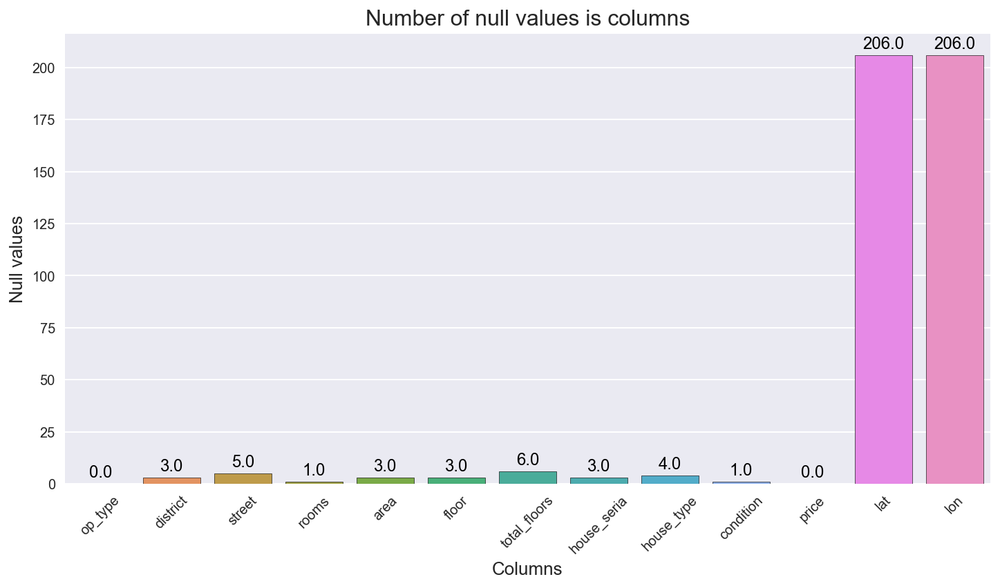

In [8]:
plt.figure(figsize=(12,6))
plot = sns.barplot(x=df.isna().sum().index, y=df.isna().sum(), edgecolor='black')
display_count(plot)
plt.xticks(rotation=45)
plt.title('Number of null values is columns', fontdict={'fontsize':16})
plt.xlabel('Columns', fontdict={'fontsize':13})
plt.ylabel('Null values', fontdict={'fontsize':13})
plt.show()

The largest number of missing values is characterized by geographical coordinates - 206 values each. Other columns have only few such values.

Subsequently, each individual column will be analyzed and cleaned.

# 1) Data cleaning – 'op_type'

In [9]:
df['op_type'].value_counts()

For sale    2680
For rent    1525
Renting        5
Other          5
Change         4
Buying         0
Name: op_type, dtype: int64

One of the most important information is the type of a published advertisement. As indicated above, a significant part belongs to one of two categories: for sale and for rent.

In order to standardize the data, the remaining few "weird" categories will be adequately changed. The "Renting" category seems to be the easiest to fix - these 5 values will be converted to 'for rent'.

In [10]:
df['op_type'] = df['op_type'].str.replace('Renting', 'For rent')

In [11]:
df['op_type'].value_counts()

For sale    2680
For rent    1530
Other          5
Change         4
Name: op_type, dtype: int64

The 'other' category is  more difficult. These values are not significantly different from the other categories. To avoid removing them completely from the dataset, their op_type will be converted according to the price contained in these rows - if the price is less than 1000 euros, the category will be converted into rent. In the second case for sale.

In [12]:
for index, row in df[df['op_type'] == 'Other'].iterrows():
    if row['price'] > 1000:
        df.loc[index, 'op_type'] = 'For sale'
    else:
        df.loc[index, 'op_type'] = 'For rent'

In [13]:
df['op_type'].value_counts()

For sale    2682
For rent    1533
Change         4
Name: op_type, dtype: int64

Lastly, op_type 'change' will be changed. Fortunately, it's only 4 rows, as presented below.

In [14]:
df[df['op_type'] == 'Change']

,op_type,district,street,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon
1560,Change,Pļavnieki,Deglava,1,38.000,2.000,5.000,103.,Brick,All amenities,45000.000,56.952,24.161
2987,Change,NaN,NaN,5,190.000,nan,nan,Priv. m.,Brick,All amenities,29900.000,46.314,11.048
3025,Change,Dzegužkalns,Tapešu,3,60.000,1.000,5.000,LT proj.,Panel,All amenities,60.000,56.941,24.053
4435,Change,Imanta,Slokas 130,3,nan,1.000,12.000,Čehu pr.,Brick,All amenities,110000.000,56.964,24.020


In [15]:
df.loc[1560, 'op_type'] = 'For sale'  #insert new value
df.loc[3025, 'op_type'] = 'For rent'  #insert new value
df.drop(index=2987, inplace=True) #remove row

The first and third lines seem fairly simple to fix. As above, their type will be adjusted based on the price. The second row will be deleted in its entirety - it contains a lot of unknown values that cannot be easily repaired, and thus will not be useful for the regression model.

For the last one, a little deeper analysis is required.

In [16]:
df[df['street'] == 'Slokas 130']

,op_type,district,street,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon
1758,For sale,Imanta,Slokas 130,4,110.000,1.000,12.000,Čehu pr.,Brick,All amenities,110000.000,56.964,24.020
4435,Change,Imanta,Slokas 130,3,nan,1.000,12.000,Čehu pr.,Brick,All amenities,110000.000,56.964,24.020


In the case of this advertisement, it can be seen that at the same address other apartment is sold at the same price, but with no space value. It looks like both of these lines mean the same property, so the line without 'area' is being removed.

In [17]:
df.drop(index=4435, inplace=True) #remove row

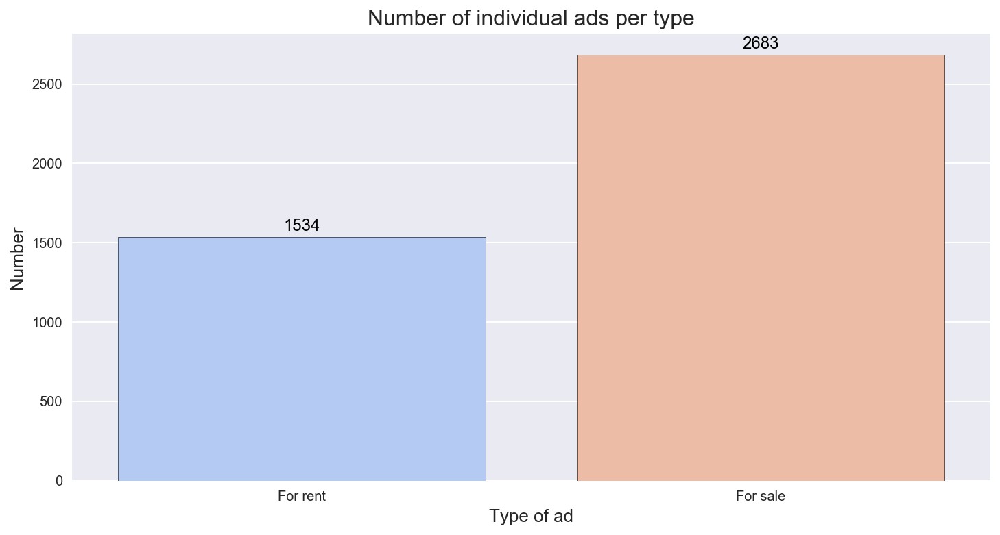

In [18]:
plt.figure(figsize=(12,6))
plot = sns.countplot(df['op_type'], palette='coolwarm', edgecolor='black')
display_count(plot)
plt.title('Number of individual ads per type', fontdict={'fontsize':16})
plt.xlabel('Type of ad', fontdict={'fontsize':13})
plt.ylabel('Number', fontdict={'fontsize':13})
plt.show()

Ultimately, the data can be divided into two groups - ads for rent and for sale. This second group is almost twice as large as the first one.

# 2) Data cleaning – 'district'

Below a list of all the unique districts in the data is presented.

In [19]:
list(df['district'].sort_values().unique())

['Aplokciems',
 'Berģi',
 'Bieriņi',
 'Bolderāja',
 'Brekši',
 'Bukulti',
 'Buļļi',
 'Daugavgrīva',
 'Dreiliņi',
 'Dzegužkalns',
 'Dārzciems',
 'Grīziņkalns',
 'Imanta',
 'Iļģuciems',
 'Jaunciems',
 'Jaunmīlgrāvis',
 'Jugla',
 'Katlakalns',
 'Kleisti',
 'Klīversala',
 'Krasta r-ns',
 'Kundziņsala',
 'Mangaļi',
 'Mangaļsala',
 'Maskavas priekšpilsēta',
 'Mežaparks',
 'Mežciems',
 'Purvciems',
 'Pļavnieki',
 'Sarkandaugava',
 'Teika',
 'Torņakalns',
 'VEF',
 'Vecdaugava',
 'Vecmīlgrāvis',
 'Vecrīga',
 'Vecāķi',
 'Voleri',
 'Zasulauks',
 'Ziepniekkalns',
 'Zolitūde',
 'centrs',
 'Āgenskalns',
 'Čiekurkalns',
 'Ķengarags',
 'Ķīpsala',
 'Šampēteris-Pleskodāle',
 'Šķirotava',
 nan]

A glance at all the alphabetically ordered values does not indicate that the data has any typos. All district names appear to be correct and sufficiently different from each other. What causes mild concern, however, are few null values (see below).

In [20]:
df[df['district'].isna()]

,op_type,district,street,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon
1197,For sale,NaN,Ogļu 32,3,79.000,1.000,4.000,Renov.,Masonry,All amenities,260000.000,56.961,24.082
3577,For sale,NaN,Pupuku iela 9,2,55.000,1.000,5.000,Jaun.,Panel,All amenities,90000.000,56.905,24.143


In [21]:
df[df['street'] == 'Ogļu 32'].head(3)

,op_type,district,street,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon
319,For rent,Ķīpsala,Ogļu 32,3,80.000,1.000,4.000,Renov.,Masonry,All amenities,1200.000,56.961,24.082
1186,For sale,Ķīpsala,Ogļu 32,3,130.000,4.000,4.000,Renov.,Masonry,All amenities,450000.000,56.961,24.082
1197,For sale,NaN,Ogļu 32,3,79.000,1.000,4.000,Renov.,Masonry,All amenities,260000.000,56.961,24.082


In the case of the first value, solving the problem with NaN value is simple - the data includes other properties that are located at the same address - this allows  to supplement the missing district, because in other cases there is only one, unique district.

In [22]:
df.loc[1197, 'district'] = 'Ķīpsala' #insert new value
df[df['street'] == 'Pupuku iela 9']

,op_type,district,street,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon
3577,For sale,NaN,Pupuku iela 9,2,55.000,1.000,5.000,Jaun.,Panel,All amenities,90000.000,56.905,24.143


However, this method does not apply to the second case, as there is only one property at the given address in the dataset.

In [23]:
df[df['street'].str.split(' ').str[0] == 'Pupuku']

,op_type,district,street,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon
3577,For sale,NaN,Pupuku iela 9,2,55.000,1.000,5.000,Jaun.,Panel,All amenities,90000.000,56.905,24.143


Although one cannot directly use information from other ads, one can use the geographical data of this location. In this case, the closest property is searched for and its neighborhood name is assigned to the unknown value. This is not a perfect method, because it is possible that the property is located on the border of two districts, but such situation seems unlikely.

In [24]:
lat_prox1 = df['lat'] > 56.905114 - 0.005
lat_prox2 = df['lat'] < 56.905114 + 0.005

lon_prox1 = df['lon'] > 24.143239 - 0.005
lon_prox2 = df['lon'] < 24.143239 + 0.005

df[lat_prox1 & lat_prox2 & lon_prox1 & lon_prox2]

,op_type,district,street,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon
3577,For sale,NaN,Pupuku iela 9,2,55.000,1.000,5.000,Jaun.,Panel,All amenities,90000.000,56.905,24.143
4271,For rent,Ziepniekkalns,Čakstes g. 49,1,19.000,1.000,2.000,Specpr.,Brick,All amenities,180.000,56.906,24.138


In [25]:
#inserting new value
df.loc[3577, 'district'] = 'Ziepniekkalns' 

Below a chart indicating the popularity of individual districts is created.

In [26]:
#checking popularity of districts
district_freq = df['district'].value_counts().to_frame() 

#calculating relative and cumulative frequency of districts
district_freq['Relative Frequency'] = district_freq / len(df['district'])
district_freq['Cumulative Frequency'] = district_freq['Relative Frequency'].cumsum()

In [27]:
district_freq.head()

,district,Relative Frequency,Cumulative Frequency
centrs,1396,0.331,0.331
Purvciems,324,0.077,0.408
Āgenskalns,232,0.055,0.463
Imanta,204,0.048,0.511
Ziepniekkalns,198,0.047,0.558


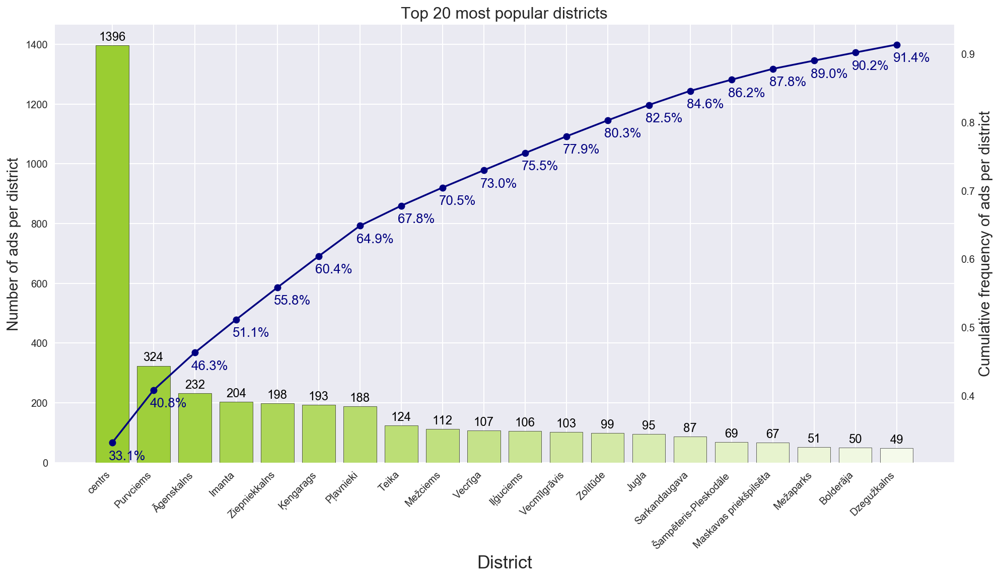

In [28]:
fig, ax1 = plt.subplots(figsize=(16,8))
ax2 = ax1.twinx()
ax1.bar(district_freq.index[:20], district_freq['district'][:20], 
        color=sns.light_palette('yellowgreen', 20, reverse=True), edgecolor='black')
ax2.plot(district_freq['Cumulative Frequency'][:20], 'o-', color='navy')
ax2.grid()

display_count(ax1)
for i,j in district_freq['Cumulative Frequency'][:20].items():
    ax2.annotate(s='{:.1%}'.format(j), xy=(i, j), ha='center', xytext=(15, -17), 
                 textcoords='offset points', color='navy', fontsize=13)

ax1.set_xticklabels(district_freq['Cumulative Frequency'][:20].index, rotation=45, ha='right')
ax1.set_title('Top 20 most popular districts', fontdict={'fontsize':16})
ax1.set_xlabel('District', fontdict={'fontsize':18})
ax1.set_ylabel('Number of ads per district', fontdict={'fontsize':15})
ax2.set_ylabel('Cumulative frequency of ads per district', fontdict={'fontsize':15}) 
plt.show()

What catches the eye in the first place is the considerable popularity of the 'centrs' district compared to the other ones - centrs alone is responsible for more than 33% of all sales and rentals ads in Riga.

Although there are 51 unique districts in the data, the 20 most popular ones account for over 91% of all ads - this means that all the other ones are extremely unpopular comparing to the top 20.

# 3) Data cleaning – 'street'

The next feature to be cleaned is 'street'. First of all, the name of the column is changed - the data contains not only information about the street on which the property is located, but the exact address.

In [29]:
 #changing name from 'street' to 'adress'
df.rename(dict(street='adress'), axis=1, inplace=True)

In [30]:
df[df['adress'].isnull()]

,op_type,district,adress,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon
677,For rent,Imanta,NaN,2,nan,nan,nan,Jaun.,NaN,All amenities,500.000,46.314,11.048
858,For rent,centrs,NaN,3,70.000,2.000,nan,NaN,NaN,NaN,900.000,46.314,11.048
1153,For rent,Purvciems,NaN,3,65.000,nan,nan,NaN,NaN,All amenities,350.000,46.314,11.048
2287,For rent,centrs,NaN,1,nan,2.000,nan,NaN,NaN,All amenities,400.000,46.314,11.048


There are four rows in the data that do not have the address of the property. In the present case, they will be permanently removed from the data - this is due to the fact that each of these four ads has up to five NaN values, which makes it impossible to fil the data. This cannot be overlooked, as these features will be used in the future to construct a price prediction model.

In [31]:
#removing the abovementioned rows
df.dropna(subset=['adress'], inplace=True)

In this case, data cleaning has already been completed.  The addresses themselves, unfortunately, do not repeat too often, which is why they do not adding extra value for the data analysis or future predictive model. 

However, adressess can still be used - in the next step, the street names will be extracted from the addresses and placed in the additional 'street' column.

In [32]:
for index, item in df['adress'].dropna().iteritems():
    try:
        df.loc[index, 'street'] = re.search('^(.+)\s(\S+)$', str(item)).group(1)
    except:
        df.loc[index, 'street'] = df.loc[index, 'adress']

In [33]:
print('before:\t{}\nafter:\t{}'.format(df.adress.nunique(),df.street.nunique()))

before:	2527
after:	657


Extracting street names from addresses has reduced the number of unique values that could be the basis for analysis from 2527 to only 657. This will allow this information to be used in price predictions.

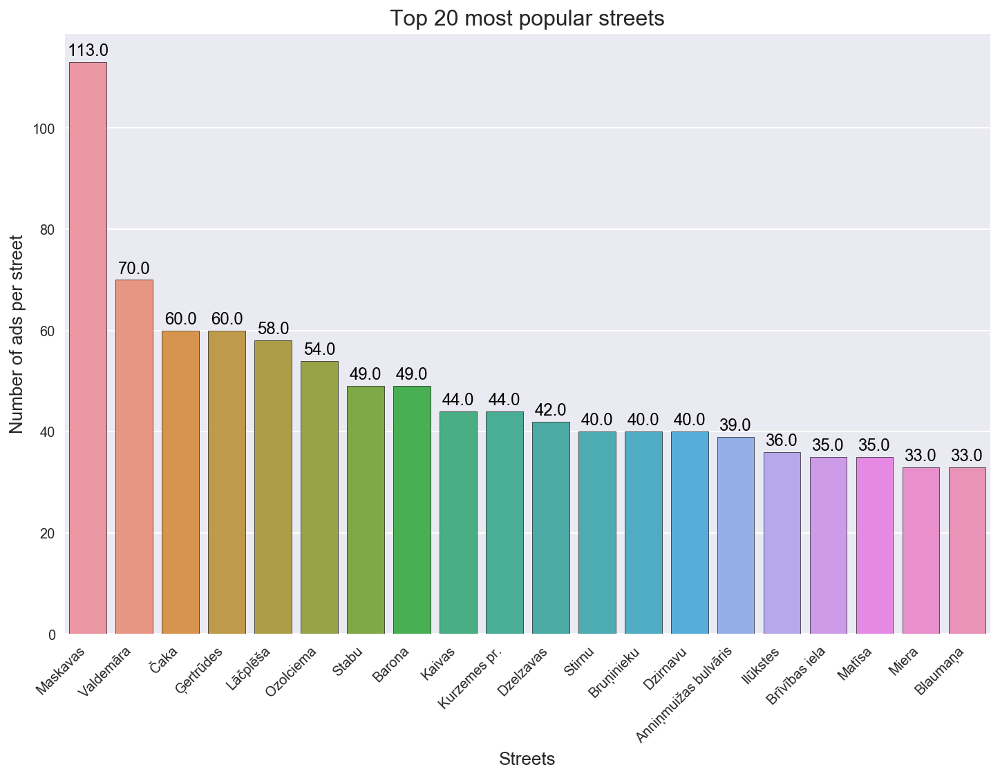

In [34]:
plt.figure(figsize=(12,8))
plot = sns.barplot(x=df['street'].value_counts()[:20].index, y=df['street'].value_counts()[:20],
                  edgecolor='black')
display_count(plot)
plt.xticks(rotation=45, ha='right')
plt.title('Top 20 most popular streets', fontdict={'fontsize':16})
plt.xlabel('Streets', fontdict={'fontsize':13})
plt.ylabel('Number of ads per street', fontdict={'fontsize':13})
plt.show()

As in the case of districts, one street stands out in particular in comparison with others - there are as many as 113 properties on Maskavas Street, which are the subject of advertisements. In this case, it can also mean that this street is disproportionately longer than the other ones.

# 4) Data cleaning – 'rooms'

In [35]:
df[df['rooms'].isnull()]

,op_type,district,adress,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon,street
1769,For sale,centrs,Dārzaugļu 1,NaN,214.000,5.000,5.000,Renov.,Brick-Panel,All amenities,165000.000,56.965,24.151,Dārzaugļu


There is only one ad in the data, which has no information on the number of rooms.

Below it is checked if there are other sales or rent offers at this address - it can give clue about the average value of the number of rooms in the apartments in a given building.

In [36]:
df[df['adress'] == 'Dārzaugļu 1']

,op_type,district,adress,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon,street
1769,For sale,centrs,Dārzaugļu 1,NaN,214.000,5.000,5.000,Renov.,Brick-Panel,All amenities,165000.000,56.965,24.151,Dārzaugļu
3997,For sale,Grīziņkalns,Dārzaugļu 1,4,108.000,2.000,6.000,Renov.,Panel-Brick,All amenities,140400.000,56.965,24.151,Dārzaugļu


Unfortunately, there is only one other advertisement at the address given. It is not enough to fill in the missing number of rooms - the missing value will be filled based on the area of the property. The table below presents statistical information on the area depending on the number of rooms.

Before this happens, it is worth paying attention to two issues that will have to be checked:
- total_floors is not equal in both rows,
- house_type is not identical,

even though they point to the same property

In [37]:
df.pivot_table( index='rooms', aggfunc=['mean', 'median', 'min', 'max'], 
               values='area').swaplevel(0,1,axis = 1)

area                       
         mean  median    min     max
rooms                               
1      30.803  30.000  5.000 187.000
2      51.917  50.000 19.000 294.000
3      77.515  74.000 18.000 228.000
4     111.091 104.000 20.000 260.000
5     144.531 140.000 50.000 250.000
6     175.246 173.500 16.000 293.000
Citi  203.029 189.500 20.000 427.000

The property that does not have the number of rooms has an area of 214 square meters. Considering the table above, the number of rooms should be 'Citi'. But what is citi? In Latvian it means 'other'.

The fact that the data contains the category 'other' value means that the number of rooms is not treated as a number and for the regression model this column will have to be broken into dummy variables.

In practice, what could 'other' mean in this case? Bearing in mind that this category has the largest area, it is probably a number of rooms greater than 6. However, the range of values is very high. It may be a good idea to get rid of all these values to prepare data for analysis.

In [38]:
df[df['rooms'] == 'Citi']['rooms'].count()

14

There are only 14 real estates in the dataset, where the number of rooms is 'other'.

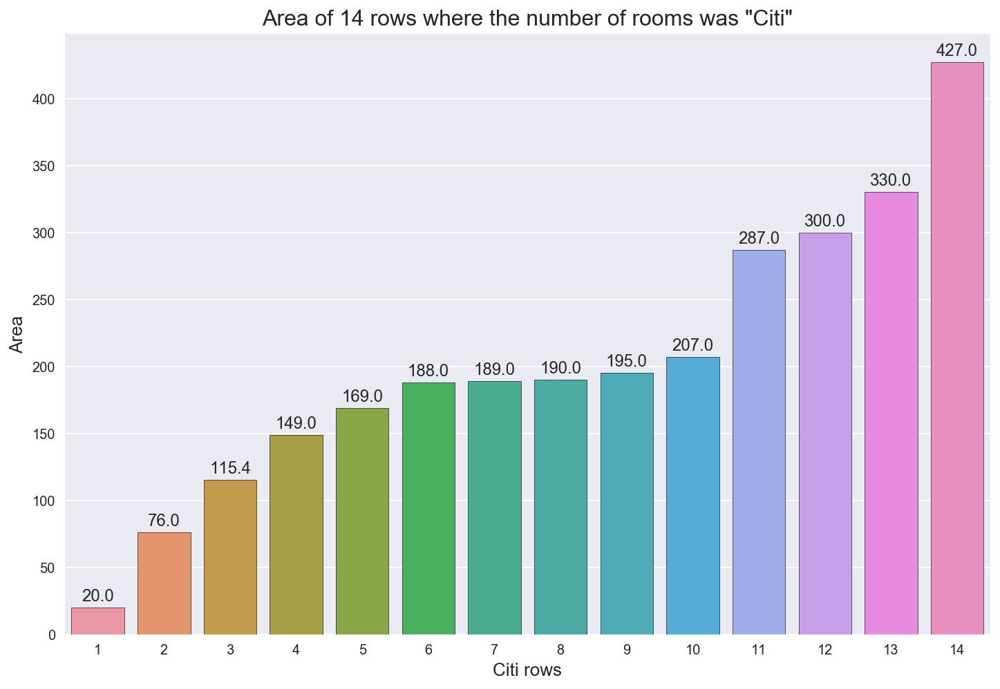

In [39]:
citi_rooms = df[df['rooms'] == 'Citi']['area'].sort_values().reset_index()

plt.figure(figsize=(12,8))
sns.barplot(data=citi_rooms, y='area', x=citi_rooms.index+1, edgecolor='black')
for i,j in citi_rooms['area'].items():
    plt.annotate(s=str(j), xy=(i, j), va='center', ha='center', xytext = (0, 8), 
                 textcoords = 'offset points', fontsize=12)
plt.title('Area of 14 rows where the number of rooms was "Citi"', fontdict={'fontsize':16})
plt.xlabel('Citi rows', fontdict={'fontsize':13})
plt.ylabel('Area', fontdict={'fontsize':13})
plt.show()

As mentioned above, the spread for area value with 'other' is very high, ranging from 20 to 427 square meters. Higher values are acceptable, but lower ones do not make sense - a property with more than 6 rooms and only 20 square meters of surface would have to have an average room area of less then 3 meters, which does not seem to be a valid value.

Considering the above, all 14 properties are removed from the dataset - perhaps this will implement greater clarity and improve the predictive quality of the model.

In [40]:
#dropping rows with 'citi'
df.drop(df[df['rooms'] == 'Citi'].index, inplace=True)

Now it can be concluded that the missing value of the number of rooms is most likely to be 6.

At the same time, the data type is changed to numerical so that the number of rooms can be used in calculations, such as the calculation of the average room area.

In [41]:
df.loc[1769, 'rooms'] = '6'
df['rooms'] = df['rooms'].astype('int32')

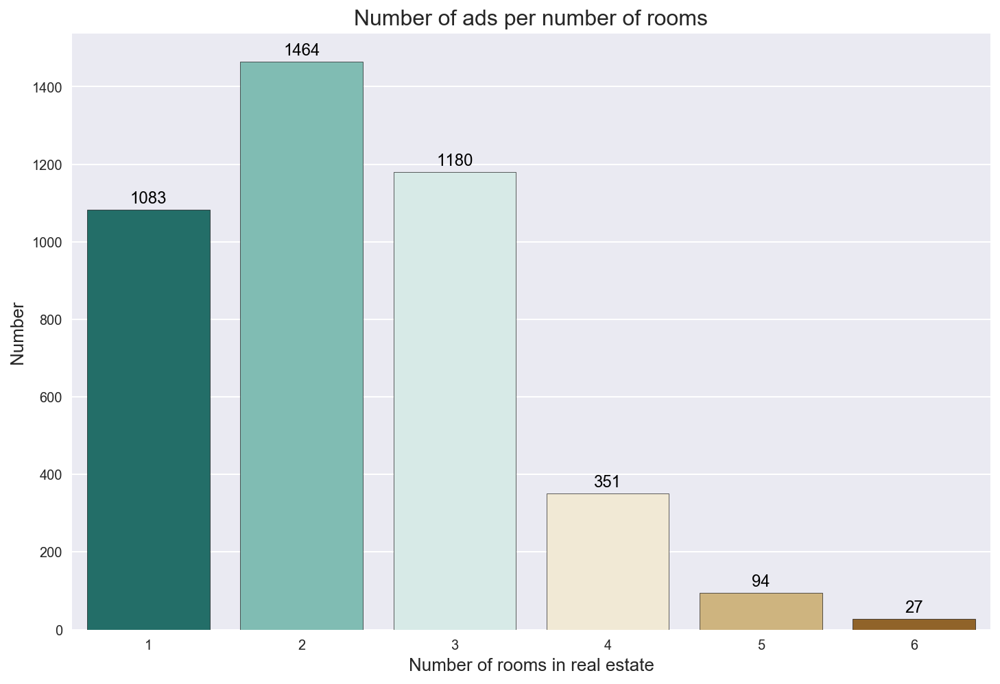

In [42]:
plt.figure(figsize=(12,8))
plot = sns.countplot(df['rooms'], palette='BrBG_r', edgecolor='black')
display_count(plot)
plt.title('Number of ads per number of rooms', fontdict={'fontsize':16})
plt.xlabel('Number of rooms in real estate', fontdict={'fontsize':13})
plt.ylabel('Number', fontdict={'fontsize':13})
plt.show()

The chart above shows that properties with 1 to 3 rooms are the most popular among the ads. Of these three, two-room ads are the most common. Other properties with more rooms play a marginal role.

# 5) Data cleaning – 'area'

The next thing is the 'area' of each real estate. In this case, there are no more NaN values, so the analysis begins with checking the distribution of values.

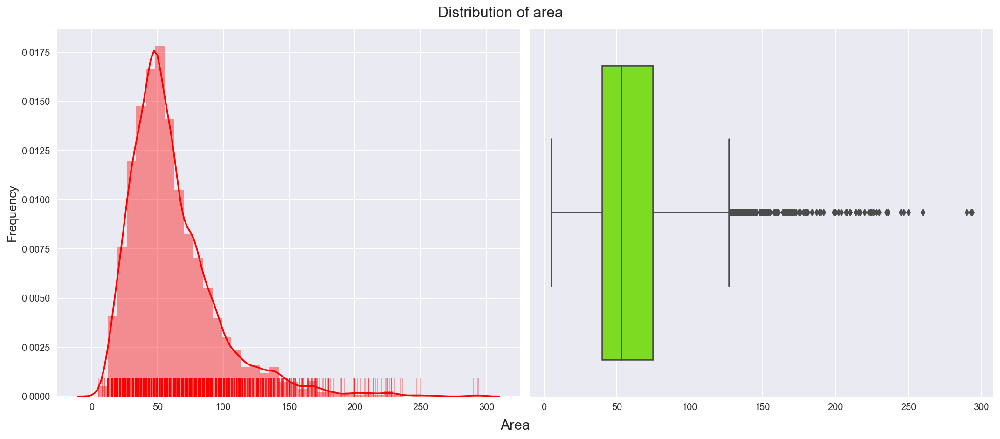

In [43]:
plt.figure(figsize=(15,6))
plt.suptitle('Distribution of area', y=1.03, fontsize=16) 
plt.subplot(121)
sns.distplot(df['area'], bins=40, color='red', rug=True, rug_kws={'alpha':0.3})
plt.xlabel('')
plt.ylabel('Frequency', fontdict={'fontsize':13})

plt.subplot(122)
sns.boxplot(df['area'], orient='h', color='lawngreen')
plt.xlabel('')
plt.figtext(s="Area", x=.5, y=-.02,  size=15)
plt.tight_layout()
plt.show()

When it comes to area - for this variable the type of advertisement does not matter, i.e. whether it concerns sale or rent. The histogram on the left is right-skewed. But what is noticeable in the first place on the box chart is a large number of outliers that have a much larger surface area than others.

Although these outliers should - and certainly will be - removed, it should be remembered that an important role of area is played by the number of rooms - a disproportionately large area means something else for a one-room apartment and another thing for a six-room apartment. With this in mind, box charts of the distribution of the size of the area divided into the number of rooms in a given property are presented below.

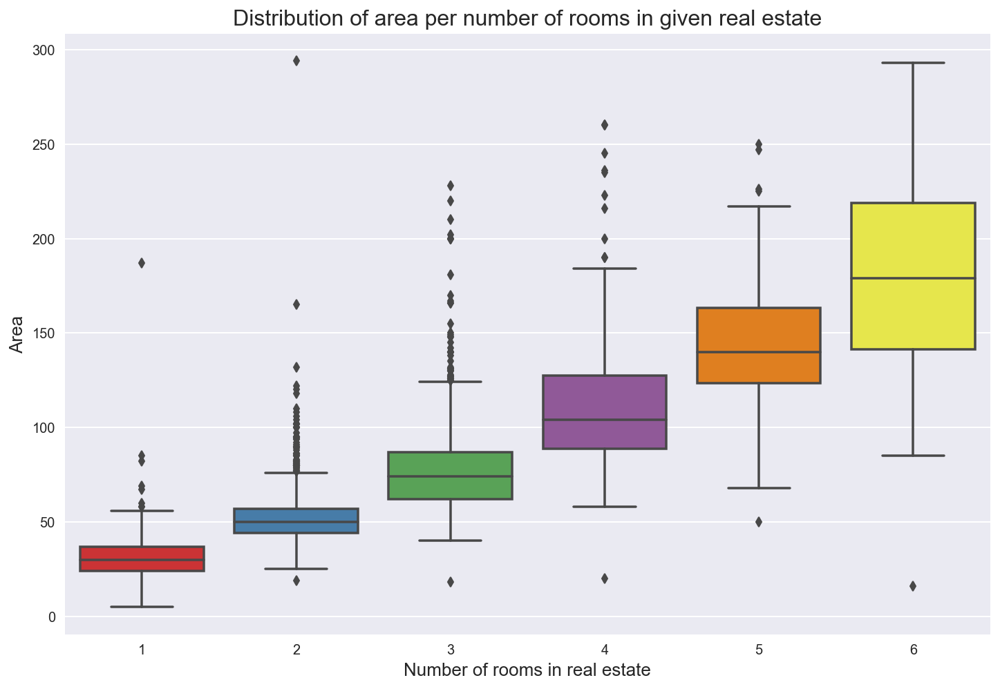

In [44]:
plt.figure(figsize=(12,8))
sns.boxplot(data=df, x="rooms", y="area", palette='Set1')
plt.title('Distribution of area per number of rooms in given real estate', fontdict={'fontsize':16})
plt.xlabel('Number of rooms in real estate', fontdict={'fontsize':13})
plt.ylabel('Area', fontdict={'fontsize':13})
plt.show()

The chart above shows values that should be considered as outliers. For example, a maximum value of 300 square meters for a property with only two rooms should certainly be considered outlier. The value of 200 square meters for a one-room real estate is outlier for this category, but if this area had 6 rooms, it would be considered normal.

In the next step, the outliers will be removed by the statistical method.

In [45]:
for room in df['rooms'].unique():
    df[df['rooms'] == room] = df[df['rooms'] == room][np.abs(
        stats.zscore(df[df['rooms'] == room]['area']) < 3)]

df.dropna(how='all', inplace=True)

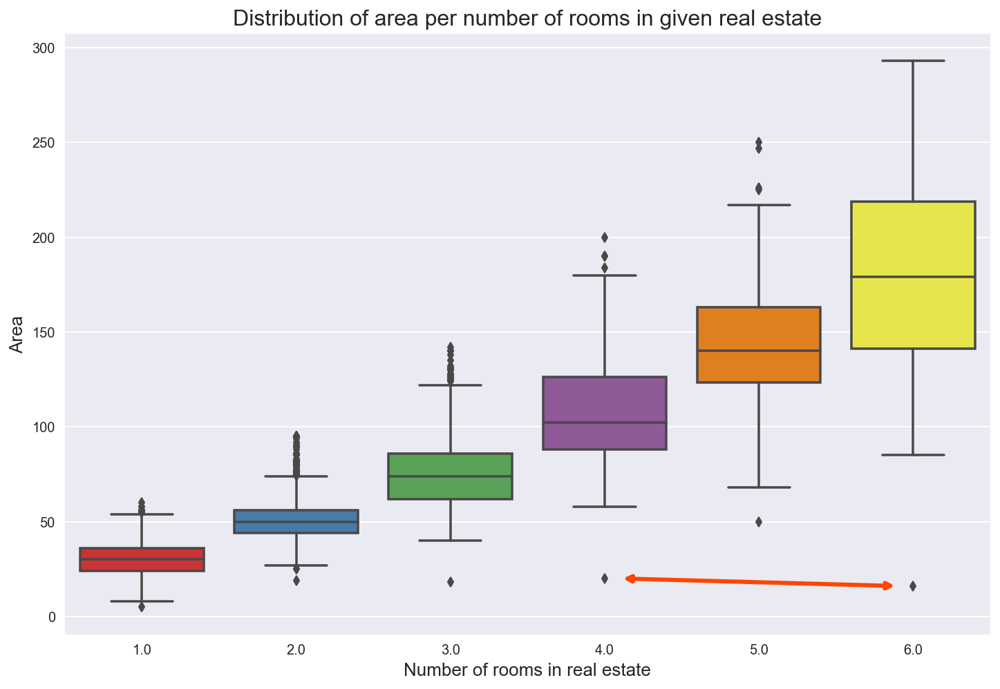

In [46]:
plt.figure(figsize=(12,8))
sns.boxplot(data=df, x="rooms", y="area", palette='Set1')
plt.title('Distribution of area per number of rooms in given real estate', fontdict={'fontsize':16})
plt.xlabel('Number of rooms in real estate', fontdict={'fontsize':13})
plt.ylabel('Area', fontdict={'fontsize':13})

plt.annotate(s='', xytext=(3.1, df[df['rooms'] == 4]['area'].min()), 
             xy=(4.9, df[df['rooms'] == 6]['area'].min()),
             arrowprops={'arrowstyle': '<->', 'lw': 3, 'color': 'orangered'})

plt.show()

In [47]:
for room in df['rooms'].unique():
    print('The smallest area ({} rooms): {}'.format(room, df[df['rooms']==room]['area'].min()))

The smallest area (1.0 rooms): 5.0
The smallest area (2.0 rooms): 19.0
The smallest area (3.0 rooms): 18.0
The smallest area (4.0 rooms): 20.0
The smallest area (5.0 rooms): 50.0
The smallest area (6.0 rooms): 16.0


Automatic deletion based on the standard deviation definitely cleared the data. However, as can be seen in the chart and in the table above, this method has left several points, which still raise somedoubts. Two potential points to be removed are indicated by a red arrow on the chart. It is hard to believe that the value of 16 square meters on a six-room property is correct. For this reason, two additional marked points are removed.

In [48]:
df.drop(index=[df[df['rooms']==4]['area'].idxmin(),
               df[df['rooms']==6]['area'].idxmin()], inplace=True)

Taking advantage of the fact that in one of the previous steps the number of rooms has been converted from category into a number, the average room size in the property will be calculated. It may be useful for further analysis or prediction.

In [49]:
df['area_per_room'] = df['area'] / df['rooms']
df['area_per_room'] = df['area_per_room'].astype('float32')

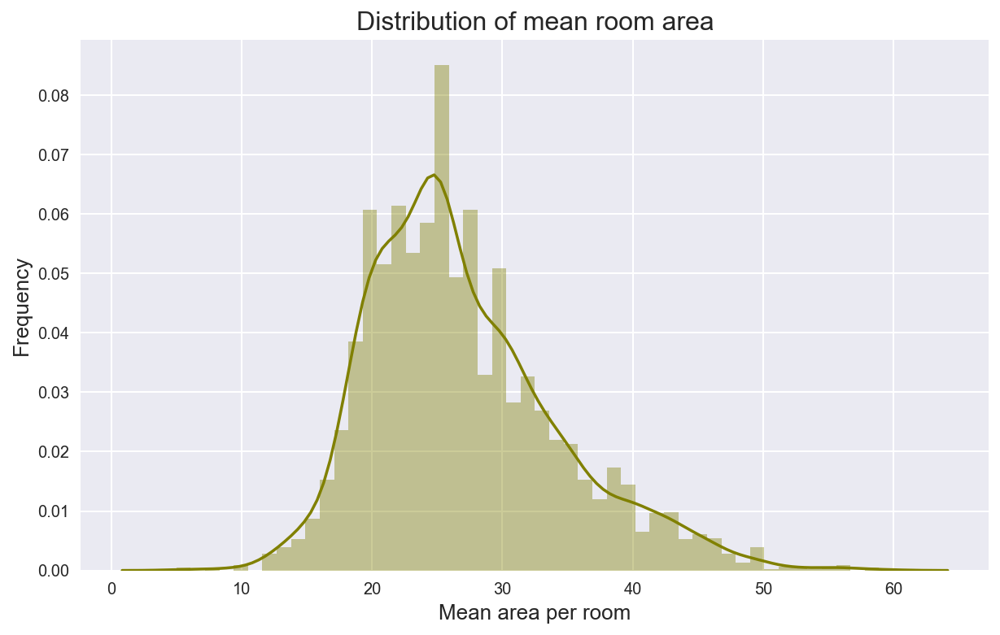

In [50]:
plt.figure(figsize=(10,6))
sns.distplot(df['area_per_room'], bins=50, color='olive')
plt.title('Distribution of mean room area', fontdict={'fontsize':16})
plt.xlabel('Mean area per room', fontdict={'fontsize':13})
plt.ylabel('Frequency', fontdict={'fontsize':13})
plt.show()

The average room size is quite close to normal distribution.

# 6) Data cleaning – 'floor' & 'total_floors'

As in the previous steps, the rows containing the NaN value are checked first.

In [51]:
df[df['floor'].isnull() | df['total_floors'].isnull()]

,op_type,district,adress,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon,street,area_per_room
2087,For rent,Imanta,Zentenes 18,1.000,15.000,7.000,nan,119.,Panel,All amenities,175.000,56.962,24.003,Zentenes,15.000


In this case, only one row has no value. The missing value is the total number of floors in a given property - fortunately, it is a constant value for a given address, so if there are more apartments at the address indicated, the missing number can be checked.

In [52]:
df[df['adress'] == 'Zentenes 18']

,op_type,district,adress,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon,street,area_per_room
1284,For sale,Imanta,Zentenes 18,3.000,62.000,3.000,9.000,602.,Panel,All amenities,51000.000,56.962,24.003,Zentenes,20.667
1508,For sale,Imanta,Zentenes 18,2.000,49.000,7.000,9.000,602.,Panel,All amenities,46000.000,56.962,24.003,Zentenes,24.500
2018,For rent,Imanta,Zentenes 18,2.000,49.000,9.000,9.000,602.,Panel,All amenities,35.000,56.962,24.003,Zentenes,24.500
2087,For rent,Imanta,Zentenes 18,1.000,15.000,7.000,nan,119.,Panel,All amenities,175.000,56.962,24.003,Zentenes,15.000


In [53]:
df.loc[2087, 'total_floors'] = 9

What causes additional doubts are situations where the indicated floor is a number greater than the total number of floors in a given real estate - this situation cannot of course occur. Below are some of these rows.

In [54]:
df[df['floor'] > df['total_floors']].head()

,op_type,district,adress,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon,street,area_per_room
45,For rent,centrs,Asara 15,1.000,38.000,5.000,2.000,Specpr.,Brick,All amenities,280.000,56.956,24.156,Asara,38.000
118,For rent,Pļavnieki,Ilūkstes 55,1.000,24.000,2.000,1.000,Priv. m.,Masonry,All amenities,220.000,56.940,24.195,Ilūkstes,24.000
282,For rent,Zolitūde,Gramzdas 19,2.000,60.000,9.000,5.000,119.,Panel,All amenities,300.000,56.944,24.008,Gramzdas,30.000
382,For sale,Maskavas priekšpilsēta,Daugavpils 76,1.000,25.000,6.000,5.000,P. kara,Brick,All amenities,23000.000,56.946,24.141,Daugavpils,25.000
558,For sale,Vecmīlgrāvis,Meldru 6,2.000,43.000,5.000,4.000,Hrušč.,Brick,All amenities,30000.000,57.028,24.102,Meldru,21.500


This situation must be an obvious mistake made by the person who published given advertisment. In this case, to fix the data, the 'floor' and 'total_floor' values will be exchanged with each other.

In [55]:
for index, row in df[df['floor'] > df['total_floors']].iterrows():
    temp = row['floor']
    df.loc[index, 'floor'] = df.loc[index, 'total_floors']
    df.loc[index, 'total_floors'] = temp

After data repair, an additional column will be created to provide information on the ratio of the floor on which the property is located to the total number of floors in the building. This will give a picture of whether the apartment is, for example, in the lower part of the building or maybe closer to the top.

In [56]:
df['floor_ratio'] = df['floor'] / df['total_floors']

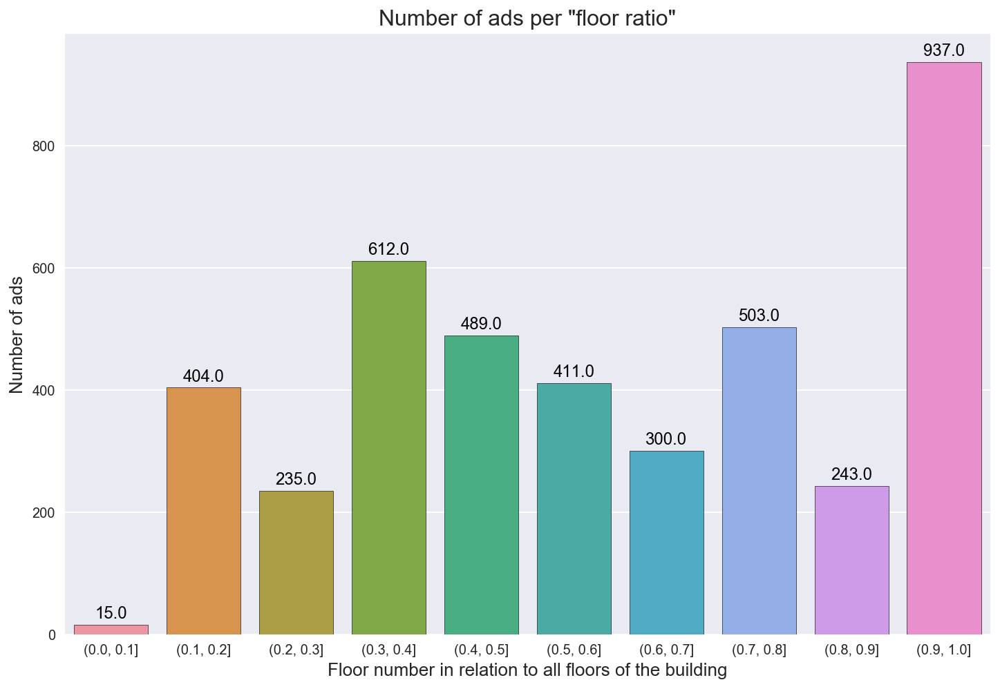

In [57]:
bins_ratio = np.arange(0, 1.1, .1)
floor_ratio = df.groupby(by=pd.cut(df['floor_ratio'], bins_ratio, 
                                  right=True))['area'].count()
plt.figure(figsize=(12,8))
plot = sns.barplot(x=floor_ratio.index, y=floor_ratio, edgecolor='black')
display_count(plot)
plt.title('Number of ads per "floor ratio"', fontdict={'fontsize':16})
plt.xlabel('Floor number in relation to all floors of the building', fontdict={'fontsize':13})
plt.ylabel('Number of ads', fontdict={'fontsize':13})
plt.show()

As can be seen in the chart above, most real estates are located close to the last floor of building. Only 15 ads are linked to flats that are located near the ground floor in very high, at least 10-story buildings.

# 7) Data cleaning – 'house_seria', 'house_type', 'condition'

In the next section, three more columns of data will be analyzed.

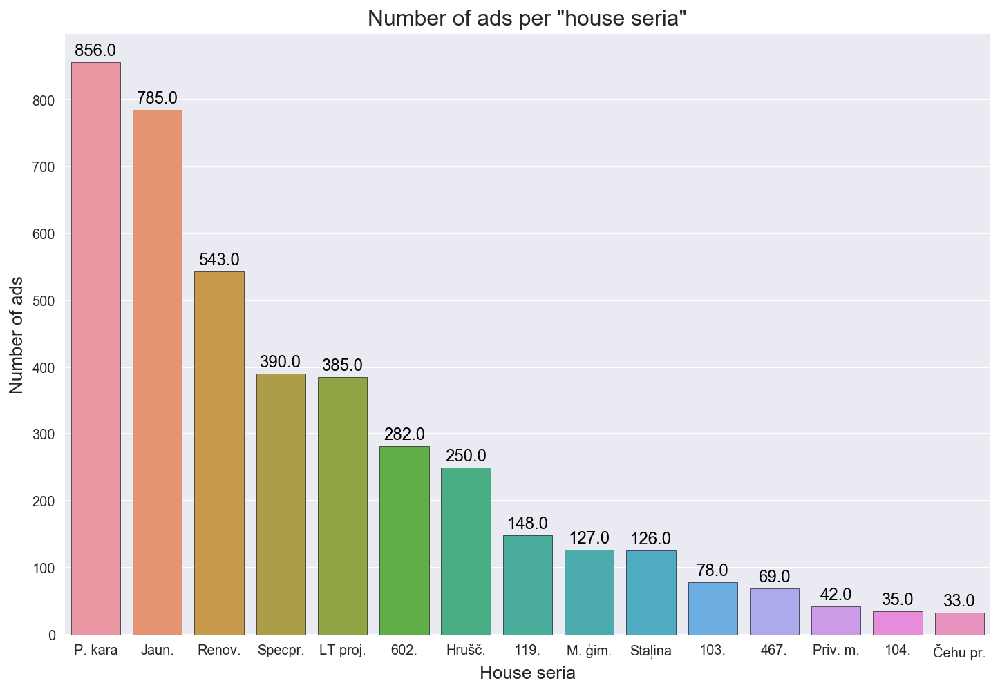

In [58]:
plt.figure(figsize=(12,8))
plot = sns.barplot(df['house_seria'].value_counts().index, df['house_seria'].value_counts(),
           order=df['house_seria'].value_counts().index, edgecolor='black')
display_count(plot)
plt.title('Number of ads per "house seria"', fontdict={'fontsize':16})
plt.xlabel('House seria', fontdict={'fontsize':13})
plt.ylabel('Number of ads', fontdict={'fontsize':13})
plt.show()

House design as a feature does not require additional cleaning - the data does not contain any NaN values or other visible errors. On the chart above, a person fluent in Latvian may check which home style appears most often in the ads.

A more important column in which a potential error could be found is 'house_type' - building type in which the flat from given announcement is located. In one of the previous analysis steps, it could be seen that the same building in two different rows had a house_type 'Brick-Panel' and 'Panel-Brick'. Due to the fact that these categories are probably identical, the next step will filter ads in which one of these two types appears and the number of situations where the same address is described by these two features at the same time.

In [59]:
brick_panel = df['house_type'] == 'Brick-Panel'
panel_brick = df['house_type'] == 'Panel-Brick'

house_type_check = df[brick_panel | panel_brick].sort_values('adress').reset_index()
house_type_check.head()

,index,op_type,district,adress,rooms,area,floor,total_floors,house_seria,house_type,condition,price,lat,lon,street,area_per_room,floor_ratio
0,1255,For rent,Vecrīga,13. janvāra 21,2.000,55.000,2.000,5.000,Jaun.,Brick-Panel,All amenities,35.000,56.944,24.111,13. janvāra,27.500,0.400
1,3777,For sale,Vecrīga,13. janvāra 21,3.000,91.000,2.000,6.000,Jaun.,Panel-Brick,All amenities,198000.000,56.944,24.111,13. janvāra,30.333,0.333
2,3203,For rent,centrs,13. janvāra 21,2.000,60.000,2.000,6.000,Jaun.,Brick-Panel,All amenities,850.000,56.944,24.111,13. janvāra,30.000,0.333
3,2204,For sale,Purvciems,Ainavas 2a,3.000,82.000,2.000,6.000,Jaun.,Panel-Brick,All amenities,123000.000,56.964,24.190,Ainavas,27.333,0.333
4,4087,For sale,centrs,Akas 9,3.000,78.000,3.000,5.000,Specpr.,Brick-Panel,All amenities,169000.000,56.957,24.126,Akas,26.000,0.600


In [60]:
house_type_check['adress'].nunique()

457

In [61]:
counter = 0
for index, row in house_type_check.iterrows():
    if index == 0:
        continue
    if (row['adress'] == house_type_check.loc[index-1, 'adress']) and (
        row['house_type'] != house_type_check.loc[index-1, 'house_type']):
        counter += 1
counter

60

There are 457 unique addresses in the data set that have the 'Brick-Panel' or 'Panel-Brick' building type. There are as many as 60 cases in the data, where the same address has two different building types from the two mentioned above. This leads to the conclusion that these two types are really just one type that was entered by sellers and landlords in two different ways. Thus, in order to unify values, in the next step one of these values will be converted into another.

In [62]:
df['house_type'] = df['house_type'].str.replace('Panel-Brick', 'Brick-Panel')

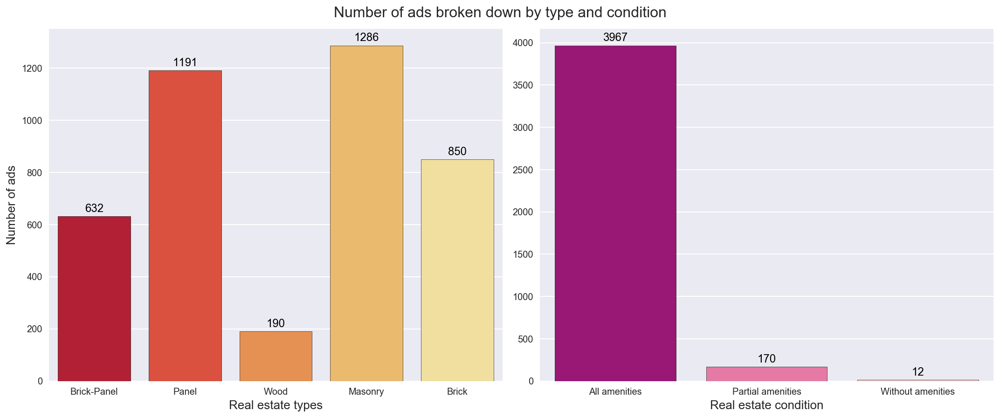

In [63]:
plt.figure(figsize=(15,6))
plt.suptitle('Number of ads broken down by type and condition', y=1.03, fontsize=16) 
plt.subplot(121)
plot = sns.countplot(df['house_type'], edgecolor='black', palette='YlOrRd_r')
display_count(plot)
plt.xlabel('Real estate types', fontdict={'fontsize':13})
plt.ylabel('Number of ads', fontdict={'fontsize':13})

plt.subplot(122)
plot = sns.countplot(df['condition'], edgecolor='black', palette='RdPu_r')
display_count(plot)
plt.xlabel('Real estate condition', fontdict={'fontsize':13})
plt.ylabel('')
plt.tight_layout()
plt.show()

Stone is the most popular construction material for buildings that are the subject of advertisements in the dataet. Equally interesting, almost published real estates can be characterized as 'all amenities'.

# 8) Data cleaning – 'lat', 'lon'

With geographical location data, things get a lot more complicated. Currently there are over 200 rows in dataset that do not have these coordinates entered. Bearing in mind that all models used for prediction do not work if there are NaN values in the data, all rows that do not have a geographical location should be removed. However, this is a very risky - this dataset has relatively few observations, and thus removing the next 200 can significantly worsen possible predictions. On the other hand, 'lat' and 'lon' columns could be removed completely, which would allow to leave these 200 rows, but would not allow any location-based columns to be added.

Considering the above, the future analysis will be based on two separate datasets:
- the set marked as 'geo' will contain location data, but 200 rows without this data will be deleted,
- the set further marked as 'df', i.e. without any geographical data, but with these 200 rows.

Geographic analysis will only be performed on the 'geo' set.

In [64]:
sale = df['op_type'] == 'For sale'
rent = df['op_type'] == 'For rent'

geo = df.dropna().copy()

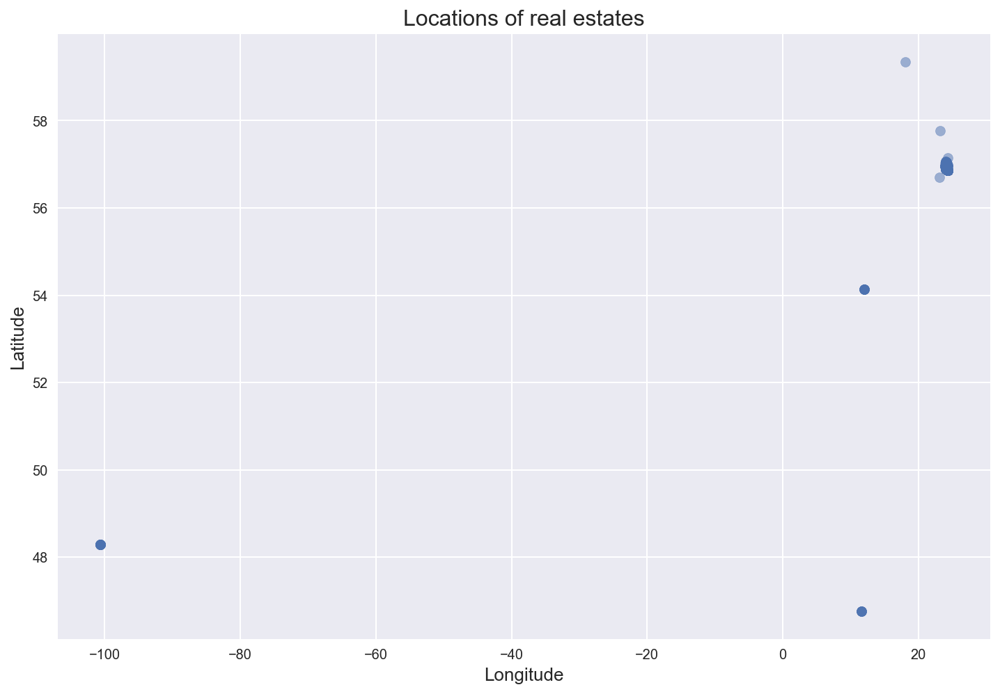

In [65]:
plt.figure(figsize=(12,8))
plt.scatter(x=geo['lon'], y=geo['lat'], alpha=.5)
plt.title('Locations of real estates', fontdict={'fontsize':16})
plt.xlabel('Longitude', fontdict={'fontsize':13})
plt.ylabel('Latitude', fontdict={'fontsize':13})
plt.show()

First of all, it should be noted that part of the geographical data is incorrect. The data are intended to show properties located in Riga, while some data indicates properties allegedly located in the USA or Switzerland.

In [66]:
#removing rows with incorrect coordinates
geo = geo[(geo['lon'] > 23.8) & (geo['lat'] < 57.1)]

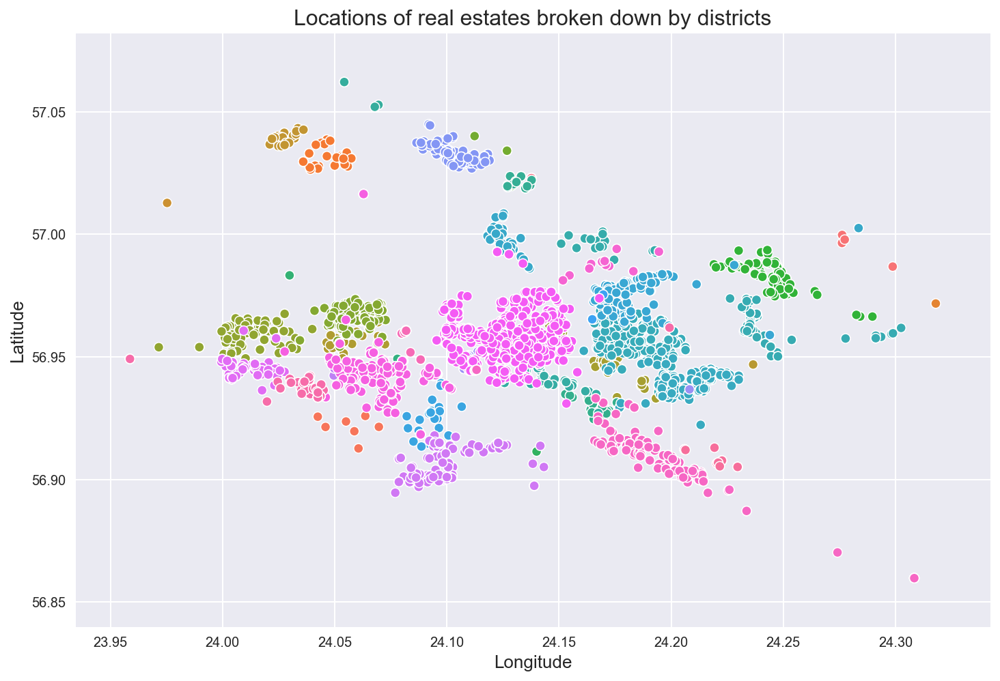

In [67]:
geo.sort_values('district', ascending=True, inplace=True)

plt.figure(figsize=(12,8))
sns.scatterplot(data=geo, x='lon', y='lat', hue='district', legend=False)
plt.title('Locations of real estates broken down by districts', fontdict={'fontsize':16})
plt.xlabel('Longitude', fontdict={'fontsize':13})
plt.ylabel('Latitude', fontdict={'fontsize':13})
plt.show()

After cleaning the data from incorrect locations, relevant points that form the shape of Riga can be seen.

In the chart above, the colors correspond to individual districts of Riga - thanks to this, it can be seen that, as a rule, the data seems to be correct. Although one can clearly see the few points that have the wrong district name entered or that have wrong coordinates. Repairing these points, however, requires difficult manual work and some knowledge about the city itself, so in this analysis this issue will be ignored.

Below the locations of the real estates will be presented while plotted on the map of Riga.

In [68]:
#creating bounds for the map
bounds = (geo['lon'].min(), geo['lon'].max(), 
          geo['lat'].min(), geo['lat'].max())

In [69]:
print('Minimum longitude: {:.6f},\nMaximum longitude: {:.6f}\n\
      \nMinimum latitude: {:.6f},\nMaximum latitude: {:.6f}'
      .format(bounds[0], bounds[1], bounds[2], bounds[3]))

Minimum longitude: 23.958742,
Maximum longitude: 24.317923
      
Minimum latitude: 56.859788,
Maximum latitude: 57.062131


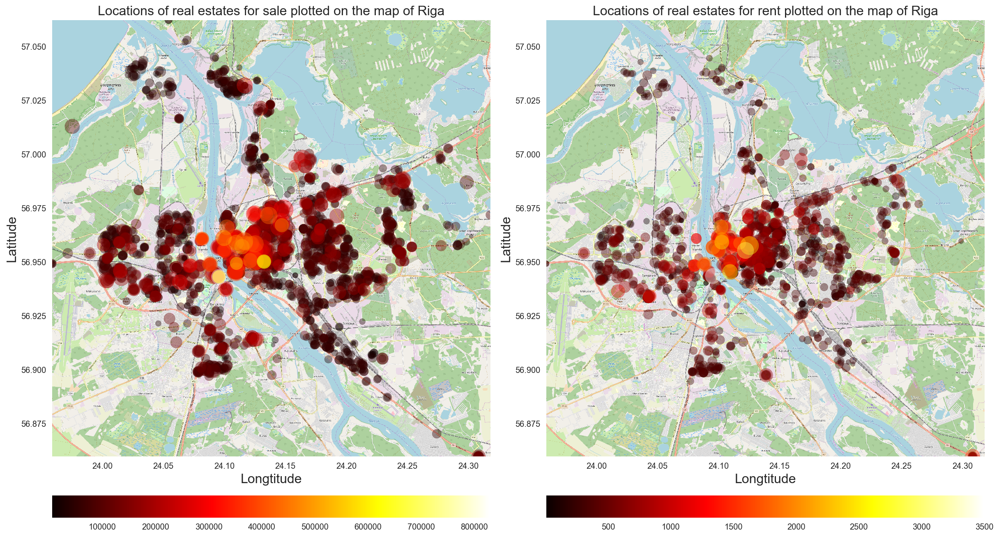

In [70]:
geo_sale = geo[geo['op_type'] == 'For sale'].copy()
geo_rent = geo[geo['op_type'] == 'For rent'].copy()
geo_sale.sort_values('price', ascending=True, inplace=True)
geo_rent.sort_values('price', ascending=True, inplace=True)
riga_map = plt.imread('riga.png')

plt.figure(figsize=(17,10))
for subplot, dataset, title in zip([121,122], [geo_sale, geo_rent], ['sale', 'rent']):
    plt.subplot(subplot)
    plot = plt.scatter(dataset['lon'], dataset['lat'], c=dataset['price'], alpha=0.4, zorder=1, 
            marker='o', s=dataset['area']*2, cmap='hot')
    plt.title('Locations of real estates for {} plotted on the map of Riga'.format(title), 
              fontdict={'fontsize':16})
    plt.ylabel('Latitude', fontdict={'fontsize':16})
    plt.xlabel('Longtitude', fontdict={'fontsize':16})
    plt.xlim(bounds[0], bounds[1])
    plt.ylim(bounds[2], bounds[3])
    plt.imshow(riga_map, zorder=0, extent=bounds, aspect='auto')
    cbar = plt.colorbar(plot, orientation="horizontal", pad=0.07)
    cbar.set_alpha(1)
    cbar.draw_all()
    plt.grid()
plt.tight_layout()
plt.show()

Locations of real estates are broken down into two maps, by properties for sale and properties for rent. The color of the marker represents the price of the property. The size represents its area.

It can be seen that the rental properties are concentrated closer to the city center the real estates for sell - this makes sense, since locations distant from the center of a given urban area are easier to sell to family rather than for instance to rent to a broke student. What is also visible in both cases is a significant increase in price the closer to the center the real estate is located. Interestingly, especially in the case of rental advertisements, the city center is also characterized by a larger area of rented real estate.

However, the fact that detailed geographical data are included for each location in the analyzed data set should be used even further. Coordinates allow checking, among others, how well the given location is connected to the rest of the city. Common knowledge is that a well-connected property is more valueable for buyers or tenants. A list of all public bus and tram stops in Riga is publicly available on the Internet. In the next step, their number in a short distance from each location will be examined.

In [71]:
#source:
#https://www.transitwiki.org/TransitWiki/index.php/Publicly-accessible_public_transportation_data [1.04.2020]
stops = pd.read_csv('stops.csv', usecols=['stop_lat', 'stop_lon', 'stop_id'], index_col='stop_id')
stops.head()

,stop_lat,stop_lon
stop_id,,
5003,56.946,24.105
1025a,56.945,24.113
1025b,56.946,24.114
1025,56.946,24.113
1251a,56.946,24.116


In [72]:
points = []
max_distance = 0.01

for index, row in stops.iterrows():
    points.append((row['stop_lat'], row['stop_lon']))

for index, row in geo.iterrows():
    temp_points = points.copy()
    temp_points.append((row['lat'], row['lon']))
    
    tree = cKDTree(temp_points)
    distances, indices = tree.query(temp_points[-1], len(temp_points), 
                                    p=2, distance_upper_bound=max_distance)
    point_neighbors = []
    for index_local, distance in zip(indices, distances):
        if distance == inf:
            break
        point_neighbors.append(temp_points[index_local])
    geo.loc[index, 'no_stops'] = len(point_neighbors)-1

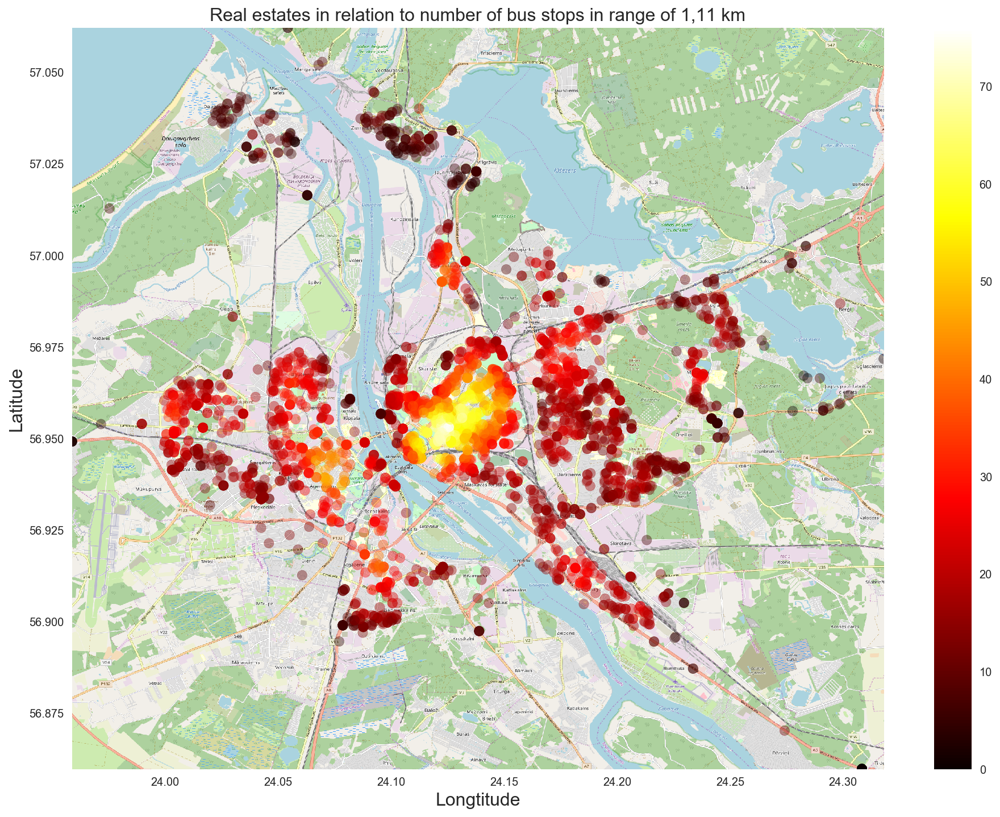

In [73]:
geo.sort_values('price', ascending=True, inplace=True)
riga_map = plt.imread('riga.png')
plt.figure(figsize=(16,12))
plot = plt.scatter(geo['lon'], geo['lat'], c=geo['no_stops'], alpha=0.4, zorder=1, 
            marker='o', s=75, cmap='hot')
plt.title('Real estates in relation to number of bus stops in range of 1,11 km',
          fontdict={'fontsize':16})
plt.ylabel('Latitude', fontdict={'fontsize':16})
plt.xlabel('Longtitude', fontdict={'fontsize':16})
plt.xlim(bounds[0], bounds[1])
plt.ylim(bounds[2], bounds[3])
plt.imshow(riga_map, zorder=0, extent=bounds, aspect='auto')
cbar = plt.colorbar(plot)
cbar.set_alpha(1)
cbar.draw_all()
plt.grid()
plt.show()

After plotting locations on the map of Riga and marking these points with the right color based on the number of stops within one kilometer distance it could be clearly see which parts of the city are better connected in terms of public transport. As a rule, the closer the center, the better the communication, but it is possible to find several places that, although quite far from the city center, are connected quite well - for instance, real estates located east of the center, near a small lake. Perhaps these relationships will allow for better price predictions.

Using locations, it is also possible to calculate the center of the city (by taking average location for properties located in the 'centrs' district) and the distance of each property from this point. Common knowledge, also resulting from the analysis above, is that the closer to the center, the higher the prices.

In [74]:
#calculating mean latitude and mean longitude
center = geo['district'] == 'centrs'
mean_lat = geo[center]['lat'].mean()
mean_lot = geo[center]['lon'].mean()

In [75]:
#calculating distance from the city center for each real estate
geo['center_dist'] = np.sqrt((geo.lat-mean_lat)**2 + (geo.lon-mean_lot)**2)

# Removing outliers in price

It is required to clean the data of any outliers that may cause disturbances in model predictions. As for this moment, dataset is divided into two separate  versions: 
- set with geographical data (such as distance from the center), but reduced by more than 200 rows, and 
- set without any geographical data, but with 200 rows more.

Subsequently, each of these two versions must be divided into another two: one for sale and the other one for rent - it should be noted that something different will be deemed as disproportionately high price for rent and something else for sale.

In [76]:
df_sale = df[df['op_type'] == 'For sale']
df_rent = df[df['op_type'] == 'For rent']
geo_sale = geo[geo['op_type'] == 'For sale']
geo_rent = geo[geo['op_type'] == 'For rent']

In [77]:
#creating function to plot two separate plots next to each other
def price_violinplot():
    plt.figure(figsize=(15,6))
    for subplot, data, op_type in zip([121, 122], [geo_sale, geo_rent], ['sale', 'rent']):
        plt.subplot(subplot)
        sns.violinplot(data=data, x='price', color='deepskyblue', inner='quartile')
        plt.title('Real estate for {}'.format(op_type), fontdict={'fontsize':16})
        plt.ylabel('')
        plt.xlabel('')
    plt.suptitle('Price', y=0, fontsize=16) 
    plt.tight_layout()
    plt.show()

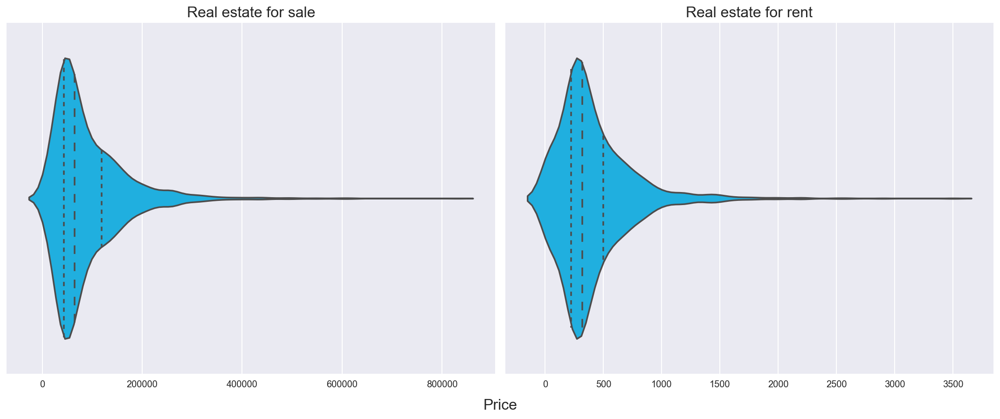

In [78]:
price_violinplot()

The graphs above show that both sets, ads for sale and ads for rent, have a definite number of outliers with much higher a price compared to the rest of real estates. Both violin plots have a very long peak - this means that there are several values in the data, very distant from 75% of the quartile.

In the next step, the data will be automatically cleaned based on the criterion of distance from the average measured in standard deviations.

In [79]:
geo_sale = geo_sale[np.abs(stats.zscore(geo_sale['price']) < 3)]
geo_rent = geo_rent[np.abs(stats.zscore(geo_rent['price']) < 3)]

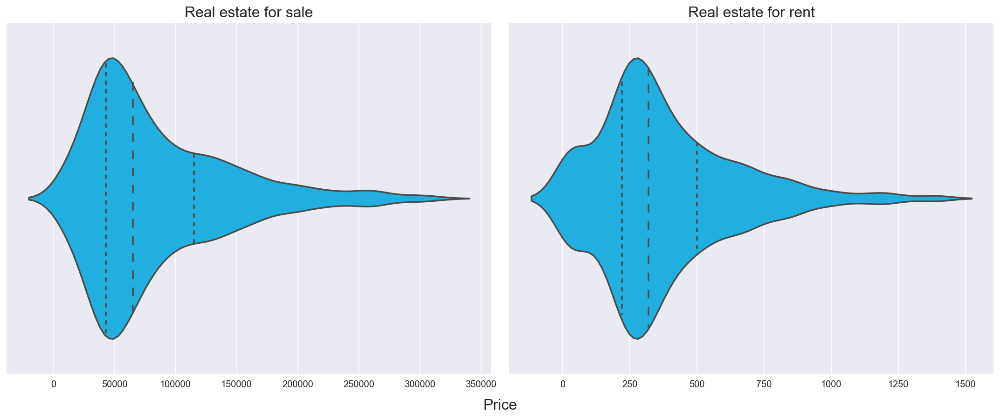

In [80]:
price_violinplot()

The cleaning of outliers described above has definitely removed the values, which in terms of sales and rent ads stood out in terms of price. 

It should be noted, however, that this was only a simple, one-dimensional cleaning based solely on the price alone - a few more values will be removed in the next step. Before this is done, however, correlation matrix will be analyzed.

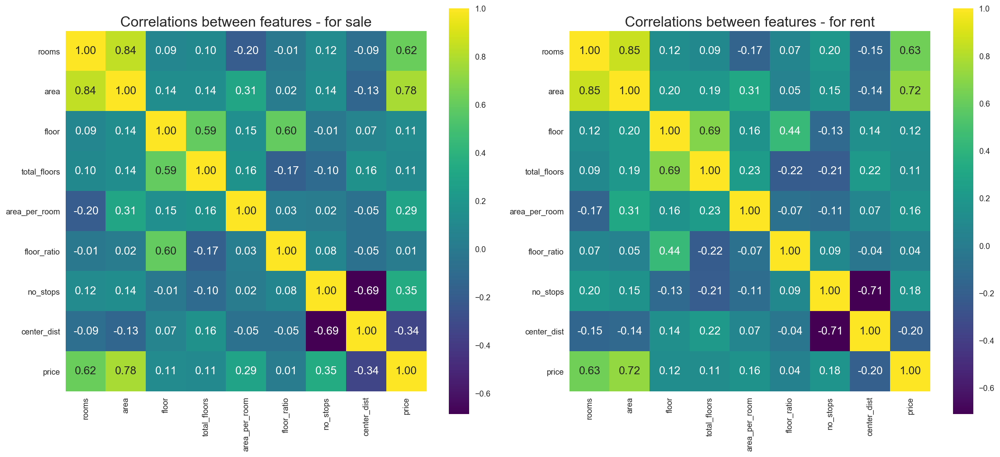

In [81]:
correlation_sale = geo_sale[geo_sale.columns[:10].to_list() + geo_sale.columns[11:].to_list()
                       + ['price']].drop(['lat', 'lon'], axis=1).corr()
correlation_rent = geo_rent[geo_rent.columns[:10].to_list() + geo_rent.columns[11:].to_list()
                       + ['price']].drop(['lat', 'lon'], axis=1).corr()

plt.figure(figsize=(18,8))
plt.subplot(121)
sns.heatmap(correlation_sale, annot=True, square=True, cmap="viridis", 
            fmt='0.2f', annot_kws={'size':14})
plt.title('Correlations between features - for sale', fontdict={'fontsize':18})
plt.subplot(122)
sns.heatmap(correlation_rent, annot=True, square=True, cmap="viridis", 
            fmt='0.2f', annot_kws={'size':14})
plt.title('Correlations between features - for rent', fontdict={'fontsize':18})
plt.tight_layout()
plt.show()

In both cases, the area is most positively correlated with the price of the property, but this is not a surprise. Other variables are correlated to a medium or low degree. In particular, it should be emphasized that there is practically zero correlation of the constructed 'floor_ratio' variable which determines the height of the floor in relation to a given building.

Based on the 'area' variable, a graph will be prepared that indicates the correlations between 'area' and 'price' - this will allow to see any subsequent observations that should be removed from the dataset.

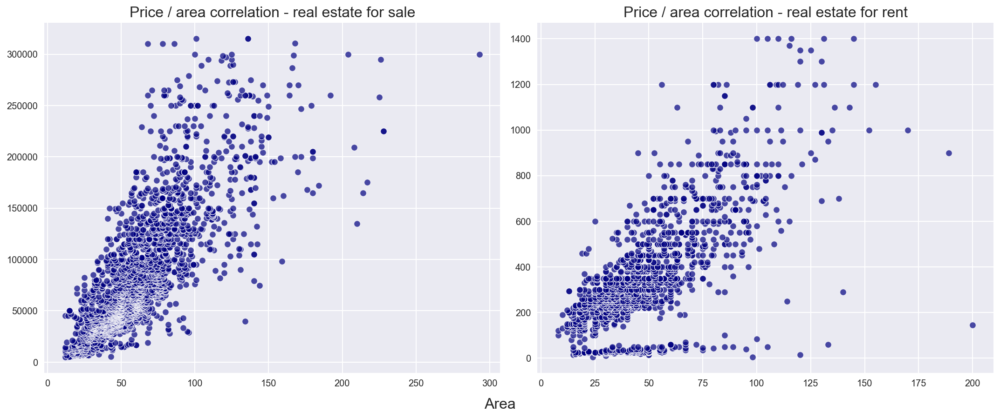

In [82]:
plt.figure(figsize=(15,6))
for subplot, data, op_type in zip([121, 122], [geo_sale, geo_rent], ['sale', 'rent']):
    plt.subplot(subplot)
    sns.scatterplot(data=data, x='area', y='price', alpha=0.7, color='navy')
    plt.title('Price / area correlation - real estate for {}'.format(op_type),
              fontdict={'fontsize':16})
    plt.ylabel('')
    plt.xlabel('')
plt.suptitle('Area', y=0, fontsize=16) 
plt.tight_layout()
plt.show()

In [83]:
geo_sale_old = geo_sale.copy()
geo_rent_old = geo_rent.copy()

geo_sale = geo_sale[~((geo_sale['price'] < 300000) & (geo_sale['area'] > 200)) &
                    ~((geo_sale['price'] < 50000) & (geo_sale['area'] > 100)) &
                    ~((geo_sale['price'] > 300000) & (geo_sale['area'] < 75)) &
                    ~(geo_sale['area'] > 250)]

geo_rent = geo_rent[~((geo_rent['price'] < 110) & (geo_rent['area'] > 30)) &
                    ~((geo_rent['price'] < 400) & (geo_rent['area'] > 100)) &
                      (geo_rent['area'] < 175)]

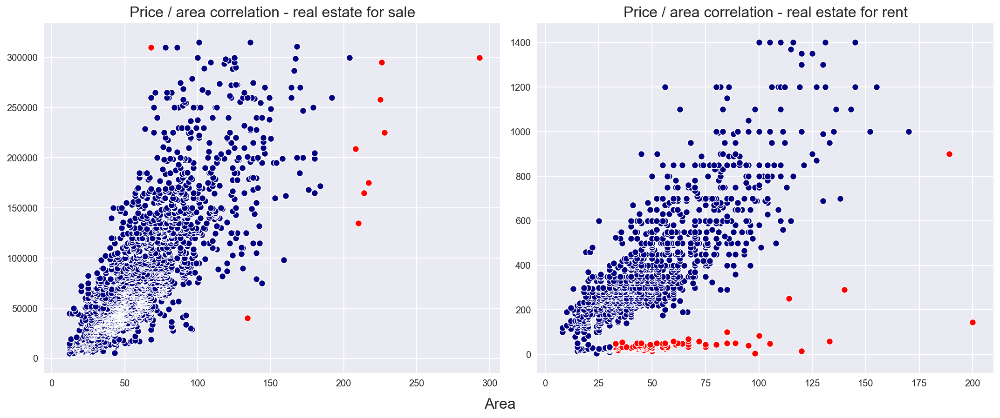

In [84]:
plt.figure(figsize=(15,6))
for subplot, data, op_type in zip([121, 122],
    [[geo_sale_old, geo_sale], [geo_rent_old, geo_rent]], ['sale', 'rent']):
    plt.subplot(subplot)
    sns.scatterplot(data=data[0], x='area', y='price', alpha=1, color='red')
    sns.scatterplot(data=data[1], x='area', y='price', alpha=1, color='navy')
    plt.title('Price / area correlation - real estate for {}'.format(op_type),
              fontdict={'fontsize':16})
    plt.ylabel('')
    plt.xlabel('')
plt.suptitle('Area', y=0, fontsize=16) 
plt.tight_layout()
plt.show()

Above are the correlation charts between 'price' and 'area'. Values marked in red color will be deleted from the dataset. What should be particularly indicated indicated in are values that form a horizontal straight line at the bottom of the chart.

Due to the fact that the above cleaning was performed only on a data set containing a geographical location, the same actions will be executen on the second version of the data.

In [85]:
df_sale = df_sale[np.abs(stats.zscore(df_sale['price']) < 3)]
df_rent = df_rent[np.abs(stats.zscore(df_rent['price']) < 3)]

df_sale = df_sale[~((df_sale['price'] < 300000) & (df_sale['area'] > 200)) &
                  ~((df_sale['price'] < 50000) & (df_sale['area'] > 100)) &
                  ~((df_sale['price'] > 300000) & (df_sale['area'] < 75)) &
                  ~(df_sale['area'] > 250)]

df_rent = df_rent[~((df_rent['price'] < 110) & (df_rent['area'] > 30)) &
                  ~((df_rent['price'] < 400) & (df_rent['area'] > 100)) &
                    (df_rent['area'] < 175)]

In [86]:
print('Final number of rows for:\n')
print('1) dataset for sale with geographical data: \t{}'.format(len(geo_sale)))
print('2) dataset for rent with geographical data: \t{}'.format(len(geo_rent)))
print('3) dataset for sale without geographical data: \t{}'.format(len(df_sale)))
print('4) dataset for rent without geographical data: \t{}'.format(len(df_rent)))

Final number of rows for:

1) dataset for sale with geographical data: 	2443
2) dataset for rent with geographical data: 	1280
3) dataset for sale without geographical data: 	2585
4) dataset for rent without geographical data: 	1353


In [87]:
geo_sale.to_csv('dataset_sale_geo.csv')
geo_rent.to_csv('dataset_rent_geo.csv')

df_sale.to_csv('dataset_sale.csv')
df_rent.to_csv('dataset_rent.csv')

# Modelling

In the last part of the analysis, regression and prediction of real estate prices will be carried out. Due to the fact that prices vary considerably depending on whether the advertisement concerns sale or rental, the prediction will be divided into two separate models. In addition, in the first step predictive capabilities of different models based on four sets of data will be compared: the aforementioned sets for sales and rental, as well as each of them broken down into data with or without geographic information.

In [88]:
#data backup for comparative purposes
dataset_sale_geo, dataset_rent_geo = geo_sale.copy(), geo_rent.copy()
dataset_sale, dataset_rent = df_sale.copy(), df_rent.copy()

Below is the automatic evaluation of selected models based on their predictive abilities for different data sets.

In [89]:
#defining lists for comparing models with loops
scores_df = pd.DataFrame()
sets = [dataset_sale_geo, dataset_rent_geo, dataset_sale, dataset_rent]
set_names = ['dataset_sale_geo', 'dataset_rent_geo', 'dataset_sale', 'dataset_rent']
dummies = ['district', 'house_seria', 'house_type', 'condition', 'street']
models = [
    #standard models
    BayesianRidge(),
    LogisticRegression(),
    GaussianProcessRegressor(),
    Lasso(), 
    Ridge(), 
    ElasticNet(), 
    HuberRegressor(), 
    DecisionTreeRegressor(),
    SVR(), 
    KNeighborsRegressor(),
    #ensemble models
    RandomForestRegressor(), 
    ExtraTreesRegressor(),
    XGBRegressor(),
    AdaBoostRegressor(),
    GradientBoostingRegressor()]

#first part of the loop responsible for data preprocessing
for dataset, name in zip(sets, set_names):
    y = dataset['price'].values
    dataset.drop(['op_type', 'adress', 'lat', 'lon', 'price', 'floor_ratio'], axis=1, inplace=True)
    X = pd.get_dummies(dataset, columns=dummies, prefix=dummies, drop_first=True)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=123)
    
    sc = StandardScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.fit_transform(X_test)
    
#the second part of the loop responsible for building the appropriate model and 
#saving its result into the table with all scores  
    for model in models:
        cv = KFold(n_splits=3, shuffle=True, random_state=123)
        scores = cross_val_score(model, X_train, y_train, 
                                 scoring='neg_mean_squared_error', cv=cv, n_jobs=-1)
        scores = np.sqrt(np.abs(scores))
        scores_df.loc[str(model).split('(')[0], name] = np.mean(scores)

Disclaimer: due to the fact that the available data sets for building models are very small by machine learning standards, it should be remembered that the division of the set into learning and test data is very important for the results.

Regression models chosen for the initial assessment of models and data sets: Lasso, Ridge, BayesianRidge, LogisticRegression, ElasticNet, GaussianProcessRegressor, HuberRegressor, DecisionTreeRegressor, SVR and KNeighborsRegressor. Although this step is only the first insight into the performance of individual models, some ensemble models that combine the predictions of several base estimators will be tried as well: RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor, GradientBoostingRegressor and XGBRegressor.

All models will be evaluated based on root mean square error (RMSE)

In [90]:
scores_df

,dataset_sale_geo,dataset_rent_geo,dataset_sale,dataset_rent
BayesianRidge,25907.464,130.531,25057.566,131.097
LogisticRegression,43366.742,191.508,40627.450,188.005
GaussianProcessRegressor,86275.149,427.032,86504.004,441.991
Lasso,26850.503,126.746,25931.933,129.803
Ridge,26819.084,141.562,26066.458,143.518
ElasticNet,26978.459,134.841,26488.489,136.024
HuberRegressor,30208.707,230.070,30473.059,235.519
DecisionTreeRegressor,32556.100,167.595,35189.617,156.453
SVR,62271.688,255.642,62795.127,267.244
KNeighborsRegressor,41775.422,211.124,43574.031,194.455


In [91]:
scores_df.min()

dataset_sale_geo   23630.679
dataset_rent_geo     119.442
dataset_sale       24392.986
dataset_rent         124.679
dtype: float64

First of all, it should be noted that the lower the RMSE, the better the model. In case of a comparison between a set containing data based on geographical location (geo) and a set without this information, for both analysis of sale prices and rental prices, the models built based on the set containing location data (geo) have slightly better results - RMSE for sales is lower by 864 euro. With this in mind, further analysis will be made solely based on this data.

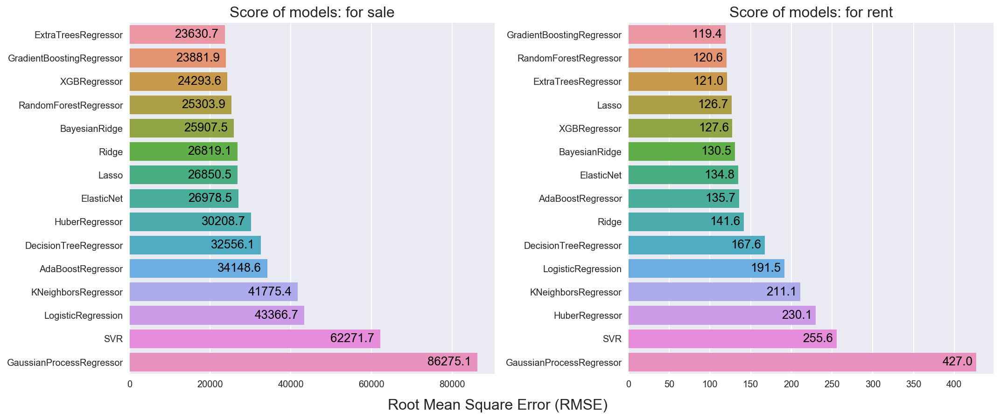

In [92]:
plt.figure(figsize=(15,6))
for subplot, data, op_type, move in zip([121, 122], 
    ['dataset_sale_geo', 'dataset_rent_geo'], ['sale', 'rent'], [-30, -20]):
    plt.subplot(subplot)
    plot = sns.barplot(data=scores_df.sort_values(data), x=data, y=scores_df.sort_values(data).index)
    for p in plot.patches:
        plot.annotate(s='{:.1f}'.format(p.get_width()),xy=(p.get_width(), p.get_y() + p.get_height()/2),
        ha='center', va='center', xytext=(move, 0), textcoords='offset points', color='black',
        fontsize=13)
    plt.title('Score of models: for {}'.format(op_type), fontdict={'fontsize':16})
    plt.ylabel('')
    plt.xlabel('')
plt.suptitle('Root Mean Square Error (RMSE) ', y=0, fontsize=16) 
plt.tight_layout()
plt.show()

Secondly, the models themselves should be compared. ExtraTrees worked best for sales price predictions, reaching RMSE at 23,630 euros. Gradient Boosting with the result of 119 euros worked best for renting prices. Detailed comparison above.

Having selected models evaluated on the basis of training data, final models for test data may be prepared.

In [93]:
#preparing data for models
y_s = geo_sale['price'].values
geo_sale.drop(['op_type', 'adress', 'lat', 'lon', 'price'], axis=1, inplace=True)

y_r = geo_rent['price'].values
geo_rent.drop(['op_type', 'adress', 'lat', 'lon', 'price'], axis=1, inplace=True)

In [94]:
#splitting sets into train and test data
X_s = pd.get_dummies(geo_sale, columns=dummies, prefix=dummies, drop_first=True)
X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(X_s, y_s, test_size=.2, random_state=123)

X_r = pd.get_dummies(geo_rent, columns=dummies, prefix=dummies, drop_first=True)
X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(X_r, y_r, test_size=.2, random_state=123)

In [95]:
#As most models require standardized data, StandardScaler is used which
#standardize features by removing the mean and scaling to unit variance
sc = StandardScaler()
X_train_s = sc.fit_transform(X_train_s)
X_test_s = sc.fit_transform(X_test_s)
X_train_r = sc.fit_transform(X_train_r)
X_test_r = sc.fit_transform(X_test_r)

#### Sale prices
The first model to be prepared is for **sales price prediction**. ExtraTrees was chosen as it achieved the best result in comparisons. In the first step, a model is prepared without marking hyperparameters to check how the model performs on the set of verification data.

In [96]:
etr = ExtraTreesRegressor(random_state=123)
etr.fit(X_train_s, y_train_s)
y_pred = etr.predict(X_test_s)

In [97]:
np.sqrt(mean_squared_error(y_test_s, y_pred))

22886.603854052046

Without tuning parameters, ExtraTrees Model achieve the score of 22886 euro. Next, by using RandomizedSearchCV, the best parameters of the model may be found, thanks to which RMSE should be maximally minimized.

In [98]:
etr = ExtraTreesRegressor()
params = {
    'n_estimators' : np.arange(50, 750, 50),
    'max_depth': [None, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
    'min_samples_leaf': [1, 2, 3, 4],
    'min_samples_split': [2, 3, 4, 5],
    'bootstrap': [True, False]}
rand_search = RandomizedSearchCV(
    estimator=etr, 
    param_distributions=params,
    scoring='neg_mean_squared_error', 
    cv=3, 
    n_jobs=-1, 
    random_state=123,
    n_iter=50)
rand_search = rand_search.fit(X_train_s, y_train_s)

In [99]:
print('For sale:')
print('- best score: {}\n- best parameters: {}'.
      format(np.sqrt(-rand_search.best_score_), rand_search.best_params_))

For sale:
- best score: 24322.366976620942
- best parameters: {'n_estimators': 100, 'min_samples_split': 3, 'min_samples_leaf': 1, 'max_depth': 20, 'bootstrap': True}


Optimization of parameters did not allow even a slight improvement of the result. What is more, each random sets of parameters achieved much worse score than default score. Having this is mind, the best parameters for ExtraTrees model are default parameters and such model will remain.

It should also be added that with regression predictive modeling problems where a numerical value must be predicted, it can also be critical to scale and perform other data transformations on the target variable. 
Bearing in mind that price, as an output variable, is right-skewed, this suggests using 
TransformedTargetRegressor. In this case, however, using the above function to transform the output data makes prediction of all models much worse. This step will be omitted in this analysis.

In [100]:
#preparing ExtraTreesRegressor again, with default parameters for best predictions
etr = ExtraTreesRegressor(
    n_estimators=100, 
    min_samples_split=2,
    min_samples_leaf=1,
    max_depth=None,
    bootstrap=False,
    random_state=123)

etr.fit(X_train_s, y_train_s)
y_pred = etr.predict(X_test_s)

In [101]:
np.sqrt(mean_squared_error(y_test_s, y_pred))

22886.603854052046

Below is presented which features the above prepared model considered the most important.

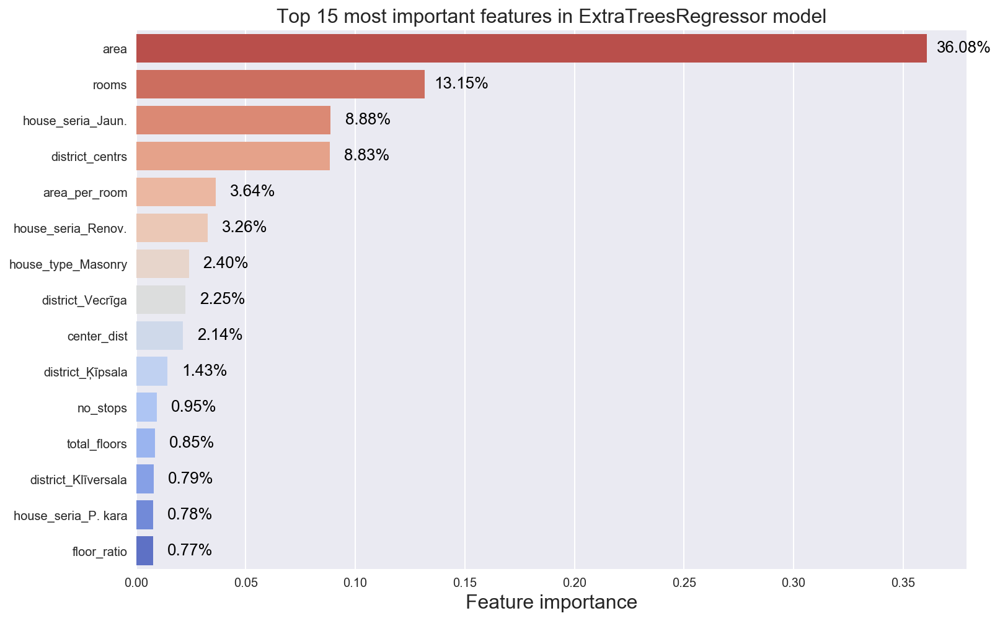

In [102]:
import_etr = pd.DataFrame(data=etr.feature_importances_, index=X_s.columns)
import_etr = import_etr.rename({0:'importance'}, axis=1).sort_values('importance', ascending=False)

plt.figure(figsize=(12,8))
plot = sns.barplot(
    x='importance', 
    palette='coolwarm_r',
    y=import_etr.index[:15], 
    data=import_etr[:15])
for p in plot.patches:
    plot.annotate(s='{:.2%}'.format(p.get_width()),xy=(p.get_width(), p.get_y() + p.get_height()/2),
    ha='center', va='center', xytext=(30, 0), textcoords='offset points', color='black',
    fontsize=13)
plt.title('Top 15 most important features in ExtraTreesRegressor model', fontsize=16)
plt.xlabel('Feature importance', fontsize=16)
plt.show()

As suggested by the matrix correlation shown earlier, the most important is the area of real estate. Together with the number of rooms, these two features logically seem to be the most important. In the chart above you can also check which types of real estate and districts are the most important. Interestingly, floor_ratio, which had a very low level of price correlation, is ranked 15th in terms of significance - it is up to a high score for almost 600 features.

In the next step, these steps will be repeated (training defalut model, randomly choosing the best parameters, checking most important features) on the second-best model in terms of predicting sale prices - it is possible that the second model, despite being inferior in theory on the training set, will achieve better results in prediction on the validation set.

In [103]:
gbr = GradientBoostingRegressor()
gbr.fit(X_train_s, y_train_s)
y_pred = gbr.predict(X_test_s)

In [104]:
np.sqrt(mean_squared_error(y_test_s, y_pred))

23243.364817312435

A default model performs slightly worse than ExtraTrees.

In [105]:
gbr = GradientBoostingRegressor()
params = {
    'n_estimators' : np.arange(50, 750, 50),
    'learning_rate': np.arange(0.1,1,0.2),
    'min_samples_leaf': [1, 2, 3],
    'min_samples_split': [2, 3, 4],
    'max_depth': np.arange(1,10,2)}
rand_search = RandomizedSearchCV(
    estimator=gbr, 
    param_distributions=params,
    scoring='neg_mean_squared_error', 
    cv=3, 
    n_jobs=-1, 
    random_state=123,
    n_iter=50)
rand_search = rand_search.fit(X_train_s, y_train_s)

In [106]:
print('For sale:')
print('- best score: {}\n- best parameters: {}'.
      format(np.sqrt(-rand_search.best_score_), rand_search.best_params_))

For sale:
- best score: 23439.921255106903
- best parameters: {'n_estimators': 500, 'min_samples_split': 4, 'min_samples_leaf': 1, 'max_depth': 5, 'learning_rate': 0.1}


In [107]:
gbr = GradientBoostingRegressor(
    n_estimators=500, 
    min_samples_split=4,
    min_samples_leaf=1,
    max_depth=5,
    learning_rate=0.1,
    random_state=123)

gbr.fit(X_train_s, y_train_s)
y_pred = gbr.predict(X_test_s)

In [108]:
np.sqrt(mean_squared_error(y_test_s, y_pred))

22151.191793576065

However, after searching for optimal parameters GradientBoostingRegressor achieves a result better than ExtraTrees!

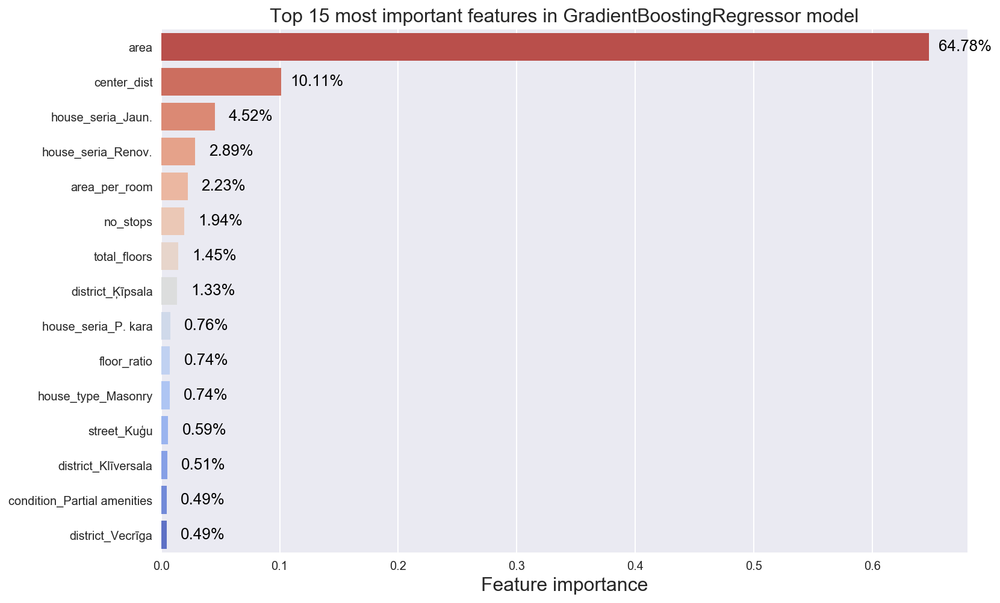

In [109]:
import_gbr = pd.DataFrame(data=gbr.feature_importances_, index=X_s.columns)
import_gbr = import_gbr.rename({0:'importance'}, axis=1).sort_values('importance', ascending=False)

plt.figure(figsize=(12,8))
plot = sns.barplot(
    x='importance', 
    palette='coolwarm_r',
    y=import_gbr.index[:15], 
    data=import_gbr[:15])
for p in plot.patches:
    plot.annotate(s='{:.2%}'.format(p.get_width()),xy=(p.get_width(), p.get_y() + p.get_height()/2),
    ha='center', va='center', xytext=(30, 0), textcoords='offset points', color='black',
    fontsize=13)
plt.title('Top 15 most important features in GradientBoostingRegressor model', fontsize=16)
plt.xlabel('Feature importance', fontsize=16)
plt.show()

GradientBoostingRegressor attaches definitely different weights to individual features. Almost 65% of the price is determined by the flat area, but the number of rooms is not in the top 15 at all.

Lastly, meta-models will be created that will contain the best-performing models so far.

In [110]:
estimators = [
    ('etr', etr), 
    ('gbr', gbr),
    ('br', BayesianRidge())]

sr = StackingRegressor(estimators=estimators, final_estimator=etr)
sr.fit(X_train_s, y_train_s)
y_pred = sr.predict(X_test_s)

In [111]:
np.sqrt(mean_squared_error(y_test_s, y_pred))

22241.071660784375

In [112]:
vr = VotingRegressor(estimators=estimators)
vr.fit(X_train_s, y_train_s)
y_pred = vr.predict(X_test_s)

In [113]:
np.sqrt(mean_squared_error(y_test_s, y_pred))

21060.947815974072

Stacking regressor does not have an exceptionally high result, but voting regressor, that fits base regressors each on the whole dataset and then averages the individual predictions to form a final prediction has the best accuracy of all models so far! 

It should be remembered that only 2443 rows of sales data are available (with only 80% of them used to train the model), so the results significantly depend on the generated split of the dataset.

#### Rent prices

In order not to repeat the same actions, in the next steps, which apply only to rental prices, it will be checked only good is the best model (with predefined parameters) and Voting Regressor, which in the case of sale prices turned out to be the best.

In [114]:
gbr = GradientBoostingRegressor()
gbr.fit(X_train_r, y_train_r)
y_pred = gbr.predict(X_test_r)

In [115]:
np.sqrt(mean_squared_error(y_test_r, y_pred))

133.7019186402134

In [116]:
estimators_rent = [
    ('rf', RandomForestRegressor()), 
    ('gbr', GradientBoostingRegressor()),
    ('ls', Lasso())]

In [117]:
vr = VotingRegressor(estimators=estimators_rent)
vr.fit(X_train_r, y_train_r)
y_pred = vr.predict(X_test_r)

In [118]:
np.sqrt(mean_squared_error(y_test_r, y_pred))

126.75439289396805

First of all, it should be noted that the models on the validation data set are much worse than how they did on the training set. In theory, the best model, GradientBoostingRegressor reaches as much as 133 euros RMSE. Improving the result by using voting regressor improved the result only to 126.

#### Bonus section - simple artificial neural network

An artificial neural network will be created as a final bonus to predict sales prices. The dataset has too few observations to be definitely better than simpler machine learning models, but it is always an interesting thing to check. However, due to computer computational limitations, the presented parameters were searched on another machine. In this analysis only the final results are presented.

In [119]:
#creating ANN with two hidden layers
def model(dropout, optimizer):
    regressor = Sequential()
    regressor.add(Dense(units=300, kernel_initializer='normal', activation='relu', input_dim=X_train_s.shape[1]))
    regressor.add(Dropout(rate=dropout, seed=123))

    regressor.add(Dense(units=150, kernel_initializer='normal', activation='relu'))
    regressor.add(Dropout(rate=dropout, seed=123))

    regressor.add(Dense(units=50, kernel_initializer='normal', activation='relu'))
    regressor.add(Dropout(rate=dropout, seed=123))

    regressor.add(Dense(units=1, kernel_initializer='normal', activation='relu'))

    regressor.compile(
        optimizer=optimizer, 
        loss='mean_squared_error', 
        metrics=['mean_squared_error'])

    return regressor

In [120]:
#dropout rate is 10% to prevent overfitting
ann = model(dropout=0.1, optimizer='adam')
ann = ann.fit(X_train_s, y_train_s, batch_size=5, epochs=150, verbose=0)

In [121]:
np.sqrt(mean_squared_error(y_test_s, ann.model.predict(X_test_s)))

26475.721151125173

It is very easy to prepare a neural network that will be so well adapted to training data that it will present results below 10k RMSE. On the other hand, it is difficult (based on this dataset) to create one that will aproach the results presented by simpler models machine learning.

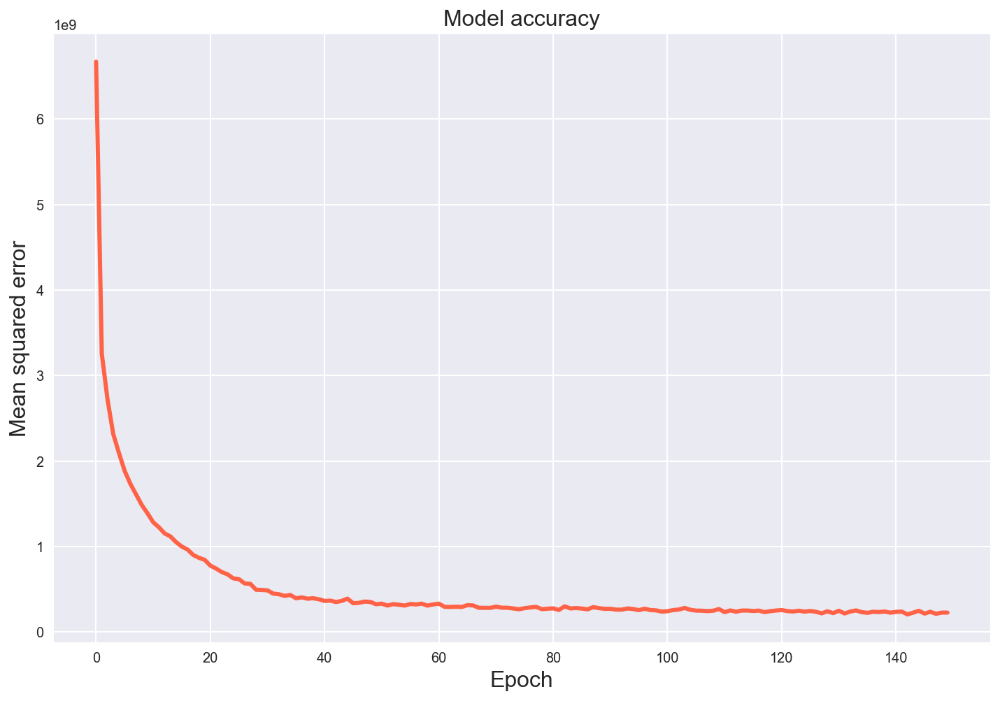

In [122]:
plt.figure(figsize=(12,8))
plt.plot(ann.history['mean_squared_error'], lw=3, color='tomato')
plt.title('Model accuracy', fontdict={'fontsize':16})
plt.ylabel('Mean squared error', fontdict={'fontsize':16})
plt.xlabel('Epoch', fontdict={'fontsize':16})
plt.show()

The graph showing historically how the neural network prediction improved indicates that further increase in the number of epochs would not improve the result, since more or less from the 40th epoch MSE has been more or less at the same level.

# Thank you very much! :)